<!-- # Field Transformation HMC: `ftHMC` -->

**TODO**:
 - [ ] Still can't reproduce their acceptance rate when running with same parameters
   - [ ] even with `leakyReLU()` as in original implementation
   - [ ] check layers and samplers against original implementation
 - [ ] Keep tuning $\tau$ and $N_{\mathrm{LF}}$ in `ftHMC`
 - [ ] Add quantitative metric $\tau_{\mathrm{int}}$ for $Q$ and look at $\delta Q_{\mathbb{Z}}$
   - [ ] Add $Q_{\mathbb{R}}$ to list of metrics tracked
 - [ ] Build & Test `pytorch.DDP` implementation for data[ ]parallel training
 - [ ] Rewrite `ftHMC` and generic `HMC` to be compatible with batch of samples
   - [ ] Try something like $x_{i+1} = m \odot x'_{i} + (1 - m) \odot x_{i}$
   - [ ] Try rewriting `ftHMC` using generators like in `samplers.make_mcmc_ensemble`
 - [ ] Test symmetry and reversibility explicitly
 - [ ] Update tracking to clearly indicate if a model was loaded from some previously trained experiment
   - [ ] In this case, want to know the prior used to train initial model
   - [ ] `logdir` containing trained model
   - [ ] original `TrainConfig` and `SchedulerConfig`
 - [ ] Try adding `sacred` for additional experiment tracking
   
 
 



### Imports

In [2]:
import os
import sys
import torch

from functools import reduce
from IPython.core.interactiveshell import InteractiveShell

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format ='retina'

InteractiveShell.ast_node_interactivity = "all"


project_dir = os.path.abspath('../../')
if project_dir not in sys.path:
    sys.path.append(project_dir)

import fthmc.utils.io as io
logger = io.Logger()

torch.manual_seed(9)
# torch.set_default_tensor_type(torch.FloatTensor)

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
#os.environ["KMP_BLOCKTIME"] = "0"
#os.environ["KMP_SETTINGS"] = "1"
#os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"

if torch.cuda.is_available():
    torch.set_default_tensor_type(torch.cuda.FloatTensor)
else:
    torch.set_default_tensor_type(torch.DoubleTensor)

import matplotlib as mpl
import matplotlib.pyplot as plt

from fthmc.train import train
from fthmc.config import Param, TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots
from fthmc.utils.logger import Logger

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False
%matplotlib inline

style_file = os.path.abspath('~/.matplotlib/stylelib/molokai.mplstyle')
if os.path.isfile(style_file):
    plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')
    plt.style.use(style_file)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import seaborn as sns

#sns.set_palette('bright')
sns.set_style('whitegrid')
colors = ['#228BE6', '#FA5252', '#40C057',
          '#FF920B', '#BE4BDB', '#FAB005',
          '#E64980', '#6A777E', '#4C6EF5']
sns.set_palette(colors)

## Define `Param` and `TrainConfig` for training the flow

In [6]:
import numpy as np

from fthmc.config import SchedulerConfig
from fthmc.main import main

#plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')

L = 8 
BETA = 7.

# -------------------------------------------
# Specify `param` and `train_config` objects
# -------------------------------------------
param = Param(**{
    'L': L, 
    'tau': 0.5,
    'nrun': 1,
    'beta': BETA,
    'nstep': 5,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
    #'nth': 0,
    #'nth_interop': 0
})

train_config = TrainConfig(**{
    'L': L,
    'beta': BETA,
    'n_era': 10,
    'n_epoch': 1000,
    'activation_fn': 'silu',
    'n_layers': 16,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 1024,
    'print_freq': 500,
    'plot_freq': 100,
    'log_freq': 100,
})

scheduler_config = SchedulerConfig(**{
    'factor': 0.95,
    'patience': 500,
    'min_lr': 5e-6,
    'verbose': True,
})

os.environ["KMP_BLOCKTIME"] = "0"
os.environ["KMP_SETTINGS"] = "1"
os.environ["KMP_AFFINITY"]= (
    "granularity=fine,verbose,compact,1,0"
)
#torch.set_num_threads(int(param.nth))
#torch.set_num_interop_threads(int(param.nth_interop))
#os.environ["OMP_NUM_THREADS"] = str(param.nth)

## Run HMC using `Param` defined above

───────────────────── Running HMC for 1 runs, of 1000 trajectories each ─────────────────────

[06:33:41]  Creating directory:                                                              
            ../../logs/hmc/lat8x8/beta7.0/t8x8_b7.0_n1000_t0.5_s5/2021-07-12-063341

[06:33:41]  Creating directory:                                                              
            ../../logs/hmc/lat8x8/beta7.0/t8x8_b7.0_n1000_t0.5_s5/2021-07-12-063341/plots

[06:33:41]  Param:                                                                           
            ----------------                                                                 
            beta=7.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=5                                                                          
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.1                                                                           
            logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/t8x8_b7.0_n
            1000_t0.5_s5

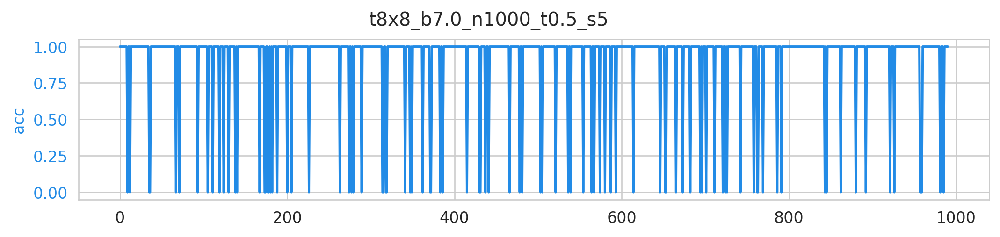

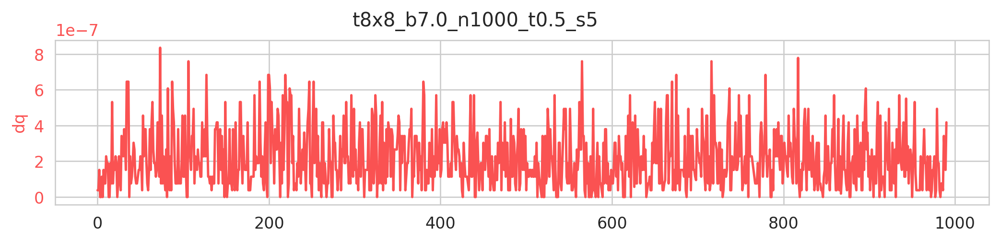

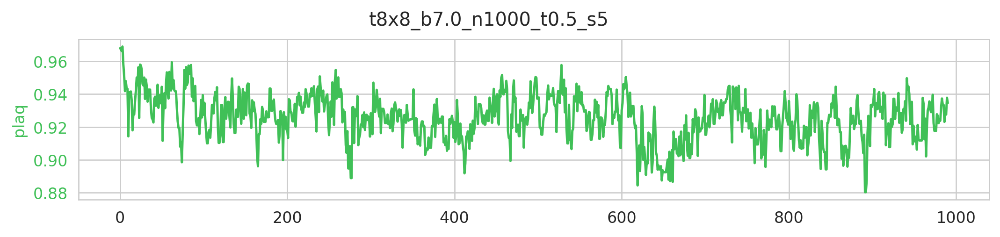

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

[06:33:42]  plaq=1.000 q=0.000

[06:33:43]  traj=2 dt=0.004 acc=1.000 dH=-0.087 plaq=0.968 q=0 dq=0.000

[06:33:49]  traj=102 dt=0.004 acc=1.000 dH=0.278 plaq=0.935 q=0 dq=0.000

[06:33:55]  traj=202 dt=0.004 acc=1.000 dH=-0.257 plaq=0.913 q=0 dq=0.000

[06:34:01]  traj=302 dt=0.004 acc=1.000 dH=-0.312 plaq=0.923 q=0 dq=0.000

[06:34:07]  traj=402 dt=0.004 acc=1.000 dH=0.047 plaq=0.911 q=0 dq=0.000

[06:34:13]  traj=502 dt=0.004 acc=1.000 dH=-0.049 plaq=0.938 q=0 dq=0.000

[06:34:19]  traj=602 dt=0.004 acc=1.000 dH=0.099 plaq=0.935 q=0 dq=0.000

[06:34:26]  traj=702 dt=0.004 acc=0.000 dH=0.221 plaq=0.915 q=0 dq=0.000

[06:34:33]  traj=802 dt=0.004 acc=1.000 dH=-0.455 plaq=0.926 q=0 dq=0.000

[06:34:39]  traj=902 dt=0.004 acc=1.000 dH=0.088 plaq=0.936 q=0 dq=0.000

[06:34:45]  Creating directory: ../../logs/hmc/lat8x8/beta7.0/t8x8_b7.0_n1000_t0.5_s5/2021-07
            -12-063341/plots/run0

[06:34:45]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s5/2021-07-12-063341/plots/run0/traj.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s5/2021-07-12-063341/plots/run0/dt.png

[06:34:46]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s5/2021-07-12-063341/plots/run0/acc.png

[06:34:47]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s5/2021-07-12-063341/plots/run0/dH.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s5/2021-07-12-063341/plots/run0/plaq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s5/2021-07-12-063341/plots/run0/q.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s5/2021-07-12-063341/plots/run0/dq.png

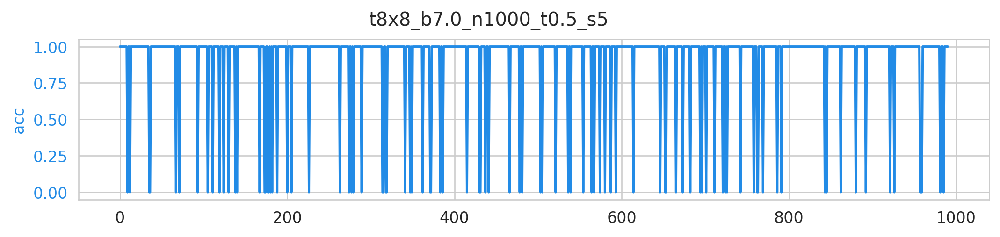

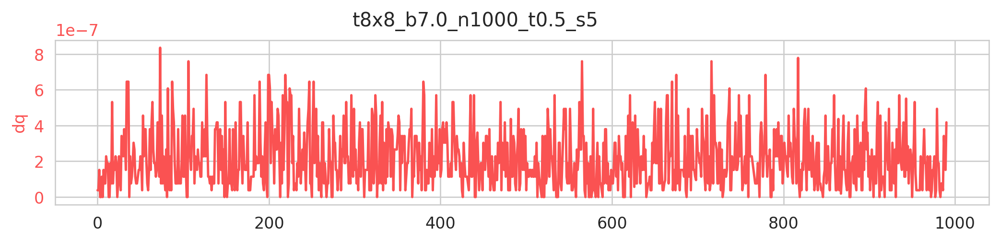

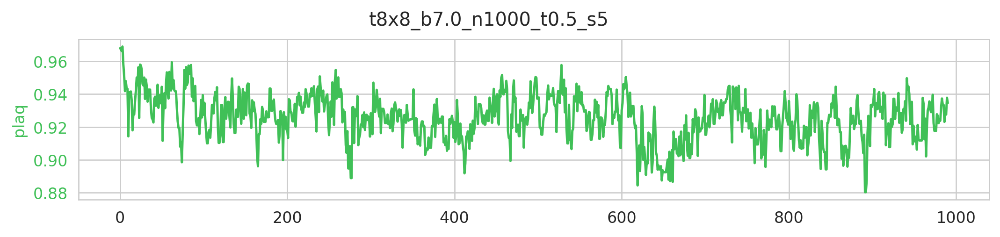

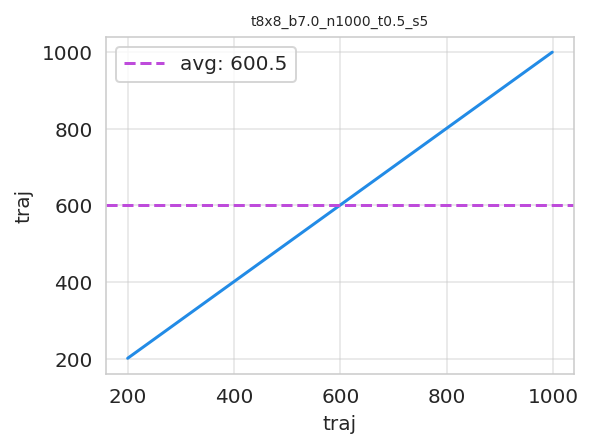

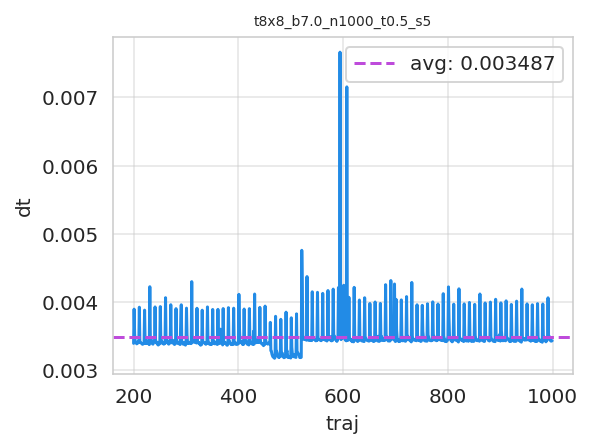

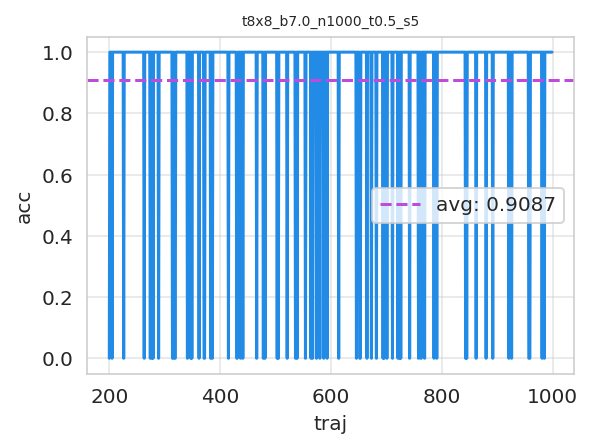

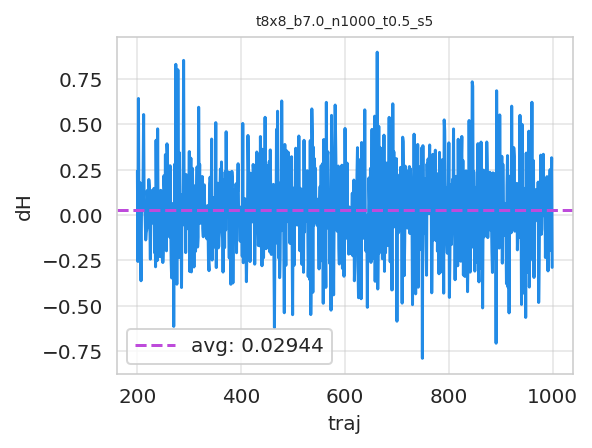

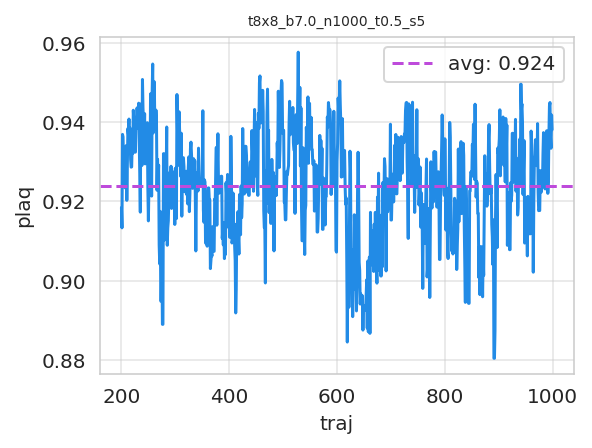

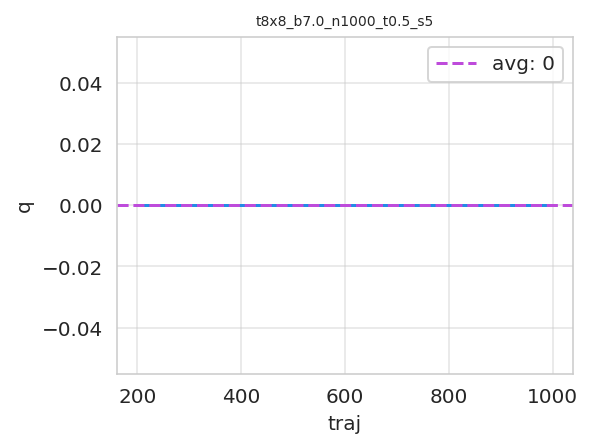

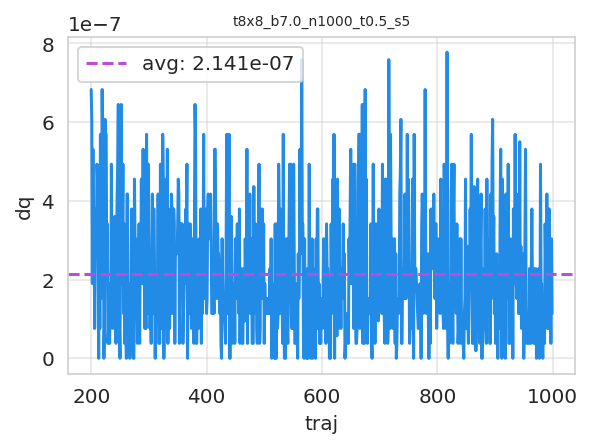

[06:34:49]  Run times: ['62.9145']

            Per trajectory: ['0.0629']

[06:34:49]  Saving hmc_histories to ../../logs/hmc/lat8x8/beta7.0/t8x8_b7.0_n1000_t0.5_s5/202
            1-07-12-063341/hmc_histories.z.

[06:34:50]  Saving hmc_fields_arr to ../../logs/hmc/lat8x8/beta7.0/t8x8_b7.0_n1000_t0.5_s5/20
            21-07-12-063341/hmc_fields_arr.z.

In [7]:
from fthmc.hmc import run_hmc
#plt.style.use('/home/foremans/.matplotlib/stylelib/molokai.mplstyle')

logger.rule(f'Running HMC for {param.nrun} runs, '
            f'of {param.ntraj} trajectories each')
hmc_fields, hmc_history = run_hmc(param, plot_metrics=True, figsize=(9, 2.))

## Train flow model using `TrainConfig` and `SchedulerConfig` defined above

────────────────────── Training FlowModel for 10 eras and 1000 epochs ───────────────────────

[06:35:03]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-063503

[06:35:03]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-063503/plots

[06:35:03]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-063503/checkpoints

[06:35:03]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-063503/summaries

[06:36:04]  Writing summaries to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/summaries

            Scheduler created!

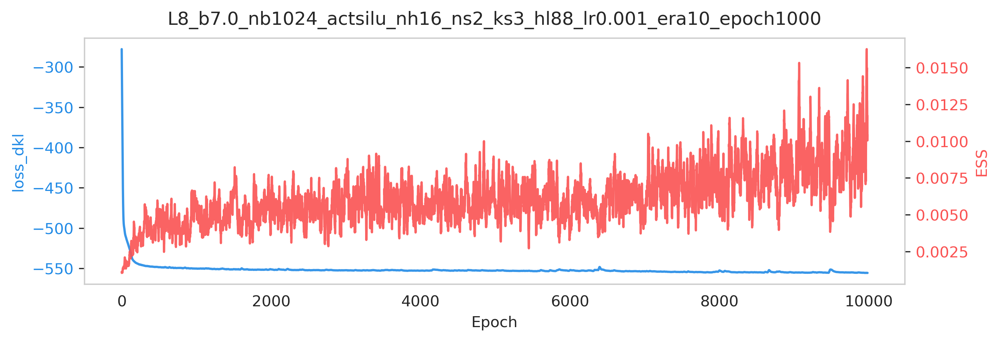

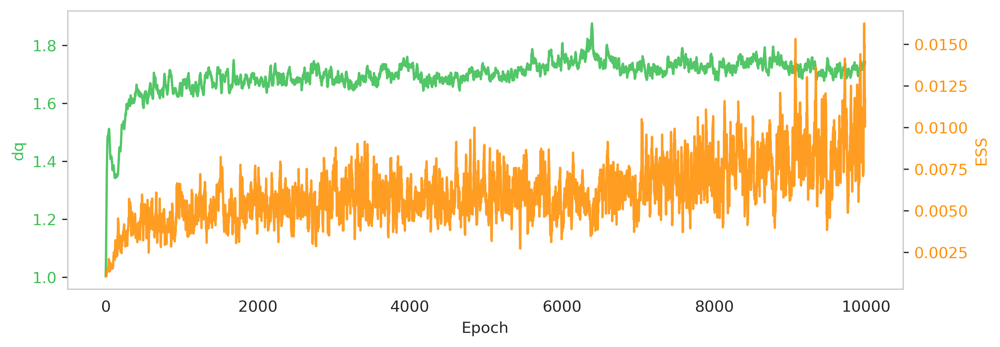

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[06:37:01]  epoch=500 dt=0.088 ess=0.009 logp=397.684 logq=-150.526 loss_dkl=-548.210        
            dq=1.660 plaq=0.888

[06:37:50]  epoch=1000 dt=0.090 ess=0.009 logp=402.379 logq=-147.910 loss_dkl=-550.289       
            dq=1.678 plaq=0.898

[06:37:51]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 1 min 46.09 sec ─────────────────────────────

[06:38:40]  epoch=1500 dt=0.090 ess=0.010 logp=402.175 logq=-148.671 loss_dkl=-550.846       
            dq=1.563 plaq=0.898

[06:39:30]  epoch=2000 dt=0.090 ess=0.001 logp=403.048 logq=-147.905 loss_dkl=-550.954       
            dq=1.670 plaq=0.900

[06:39:31]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 1 min 39.15 sec ─────────────────────────────

[06:40:20]  epoch=2500 dt=0.090 ess=0.003 logp=404.443 logq=-148.308 loss_dkl=-552.751       
            dq=1.638 plaq=0.903

[06:41:10]  epoch=3000 dt=0.090 ess=0.016 logp=403.439 logq=-148.752 loss_dkl=-552.191       
            dq=1.667 plaq=0.901

[06:41:11]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 1 min 39.28 sec ─────────────────────────────

[06:42:00]  epoch=3500 dt=0.091 ess=0.010 logp=403.729 logq=-149.118 loss_dkl=-552.847       
            dq=1.688 plaq=0.901

[06:42:50]  epoch=4000 dt=0.092 ess=0.004 logp=405.088 logq=-147.810 loss_dkl=-552.898       
            dq=1.756 plaq=0.904

[06:42:51]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 1 min 39.97 sec ─────────────────────────────

[06:43:41]  epoch=4500 dt=0.091 ess=0.003 logp=403.956 logq=-148.604 loss_dkl=-552.561       
            dq=1.636 plaq=0.902

[06:44:31]  epoch=5000 dt=0.091 ess=0.006 logp=405.125 logq=-147.744 loss_dkl=-552.868       
            dq=1.667 plaq=0.904

[06:44:32]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 1 min 39.98 sec ─────────────────────────────

[06:45:22]  epoch=5500 dt=0.089 ess=0.011 logp=405.779 logq=-147.333 loss_dkl=-553.112       
            dq=1.788 plaq=0.906

[06:46:11]  epoch=6000 dt=0.089 ess=0.002 logp=405.137 logq=-147.905 loss_dkl=-553.042       
            dq=1.723 plaq=0.904

[06:46:12]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 1 min 38.51 sec ─────────────────────────────

[06:47:01]  epoch=6500 dt=0.089 ess=0.002 logp=403.801 logq=-148.575 loss_dkl=-552.376       
            dq=1.722 plaq=0.901

[06:47:51]  epoch=7000 dt=0.089 ess=0.008 logp=406.553 logq=-146.890 loss_dkl=-553.444       
            dq=1.724 plaq=0.907

[06:47:51]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 1 min 38.28 sec ─────────────────────────────

[06:48:41]  epoch=7500 dt=0.089 ess=0.013 logp=406.492 logq=-147.733 loss_dkl=-554.225       
            dq=1.668 plaq=0.907

[06:49:31]  epoch=8000 dt=0.089 ess=0.007 logp=407.014 logq=-147.309 loss_dkl=-554.323       
            dq=1.710 plaq=0.909

[06:49:31]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 1 min 38.52 sec ─────────────────────────────

[06:50:22]  epoch=8500 dt=0.089 ess=0.002 logp=406.856 logq=-147.935 loss_dkl=-554.792       
            dq=1.797 plaq=0.908

[06:51:11]  epoch=9000 dt=0.089 ess=0.018 logp=407.700 logq=-147.373 loss_dkl=-555.073       
            dq=1.692 plaq=0.910

[06:51:11]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 1 min 38.16 sec ─────────────────────────────

[06:52:02]  epoch=9500 dt=0.089 ess=0.004 logp=404.507 logq=-146.544 loss_dkl=-551.051       
            dq=1.749 plaq=0.903

[06:52:51]  epoch=10000 dt=0.089 ess=0.014 logp=407.057 logq=-148.412 loss_dkl=-555.469      
            dq=1.787 plaq=0.909

[06:52:52]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/checkpoints/ckpt-era9-epoch999.tar

[06:52:54]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/checkpoints/ckpt-era10-epoch1001.tar

[06:52:56]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/
            2021-07-12-063503/plots

[06:52:57]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021
            -07-12-063503/plots/dt.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021
            -07-12-063503/plots/ess.png

[06:52:58]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021
            -07-12-063503/plots/logp.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021
            -07-12-063503/plots/logq.png

[06:52:59]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021
            -07-12-063503/plots/loss_dkl.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021
            -07-12-063503/plots/q.png

[06:53:00]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021
            -07-12-063503/plots/dq.png

[06:53:01]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021
            -07-12-063503/plots/plaq.png

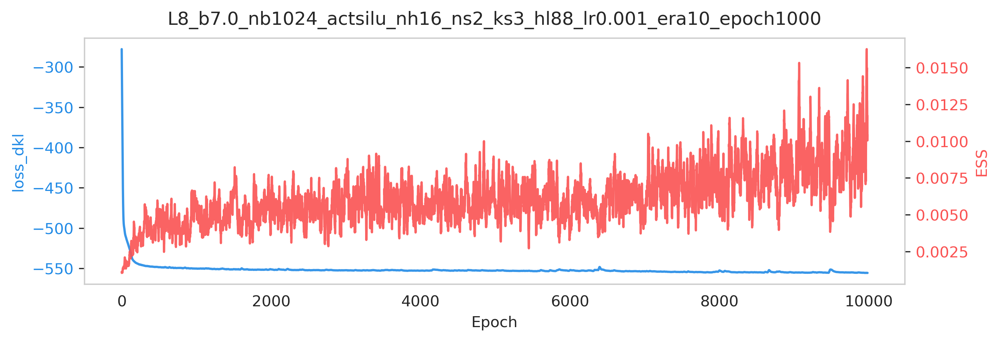

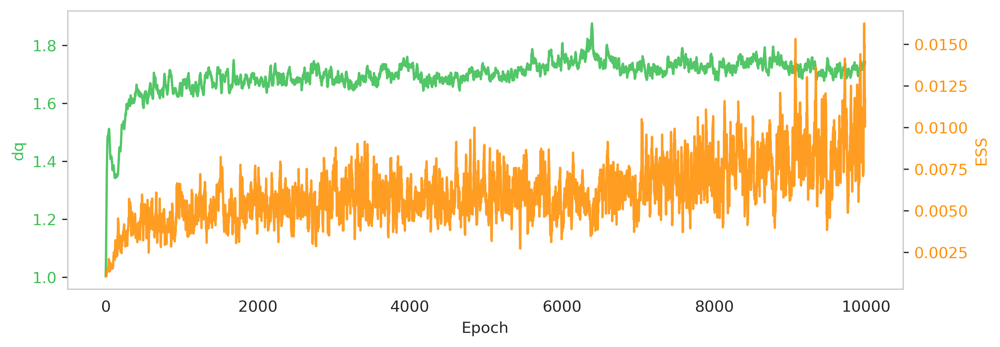

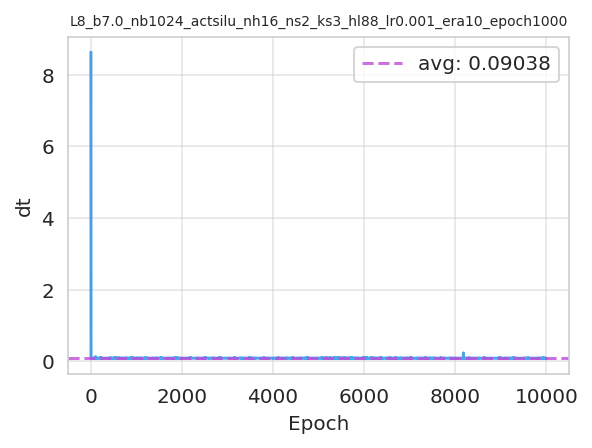

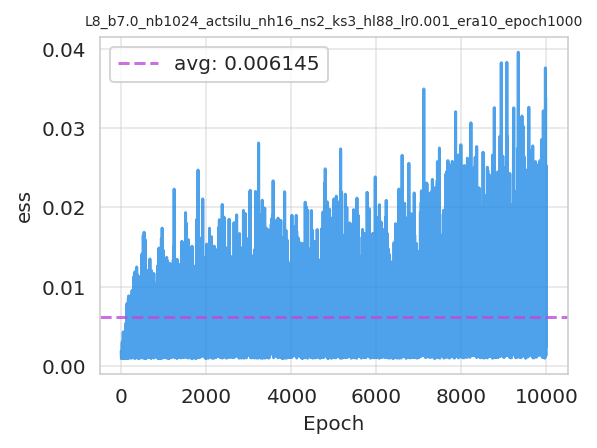

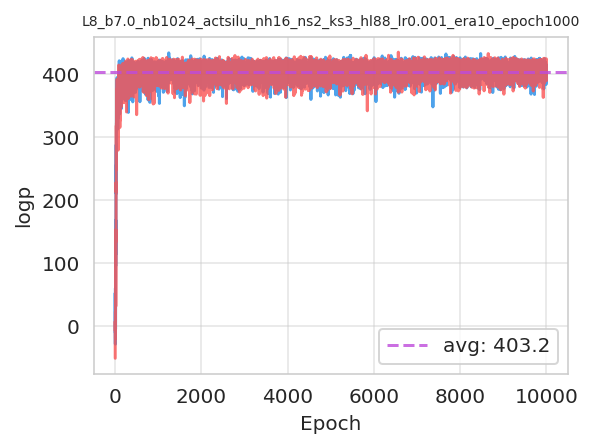

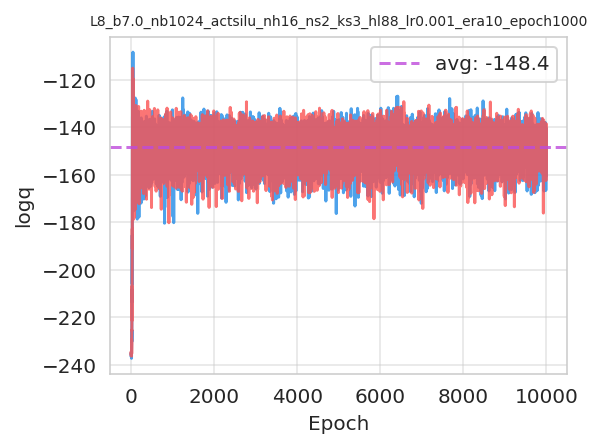

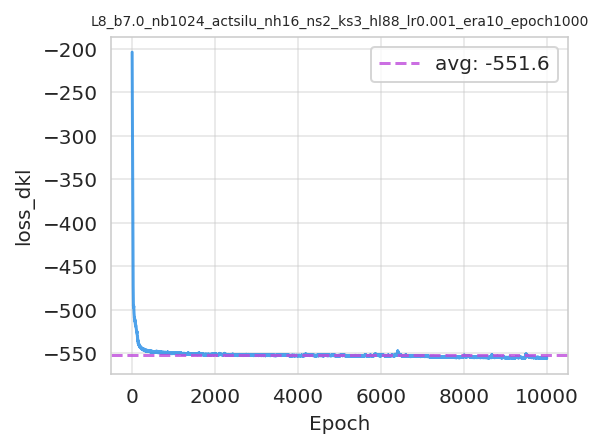

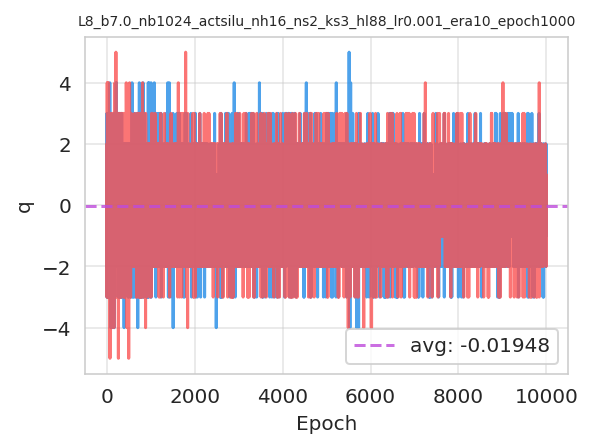

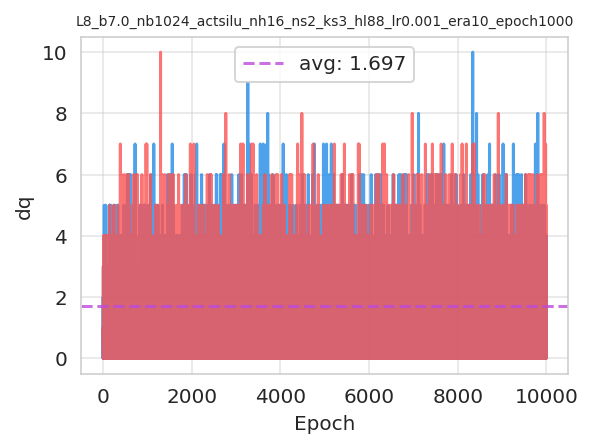

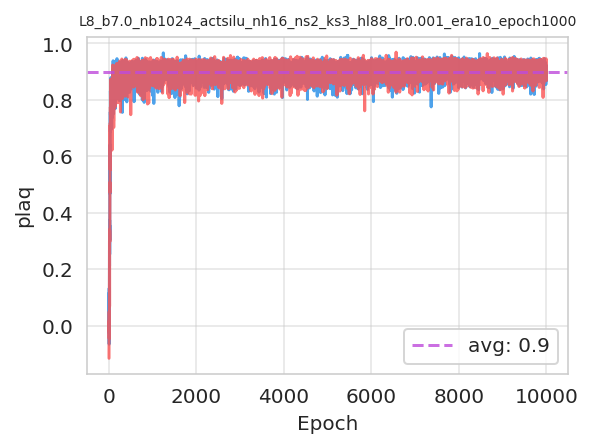

[06:53:03]  Saving train_history to ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_n
            h16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-063503/train_history
            .z.

In [8]:
from fthmc.train import train

logger.rule(f'Training FlowModel for {train_config.n_era} '
            f'eras and {train_config.n_epoch} epochs')
train_outputs = train(config=train_config,
                      model=None,  # train_outputs['model'],
                      pre_model=None,  # train_outputs['model'],
                      dpi=150,
                      figsize=(9, 3.),
                      scheduler_config=None)

## Run inference on trained model and evaluate / plot metrics

──────────────────── Running inference on trained model for 8192 samples ────────────────────

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/utils/inference.py:116: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[06:53:51]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/inference/plo
            ts/x.png

[06:53:52]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/inference/plo
            ts/logq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/inference/plo
            ts/logp.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/inference/plo
            ts/accepted.png

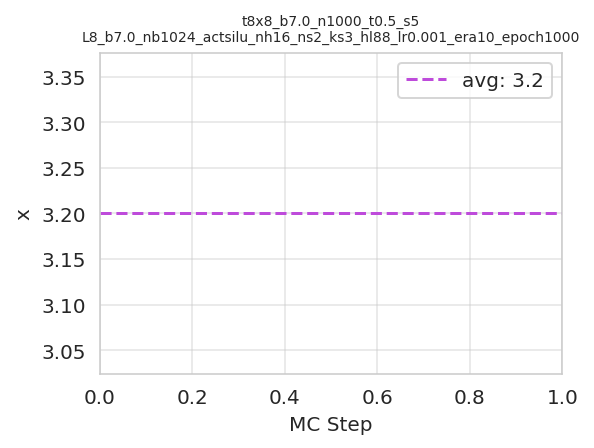

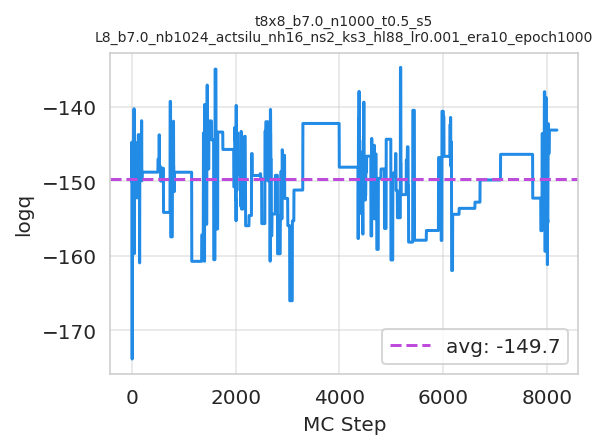

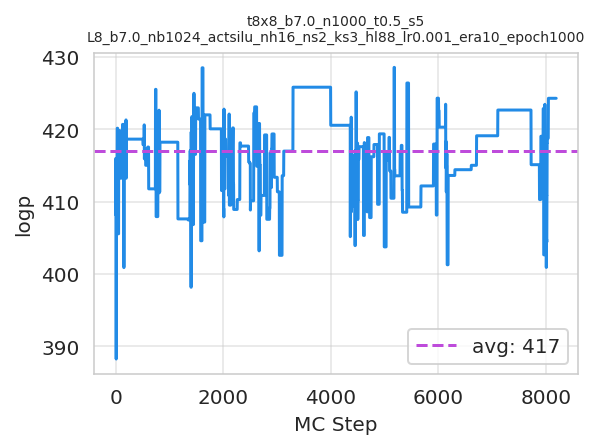

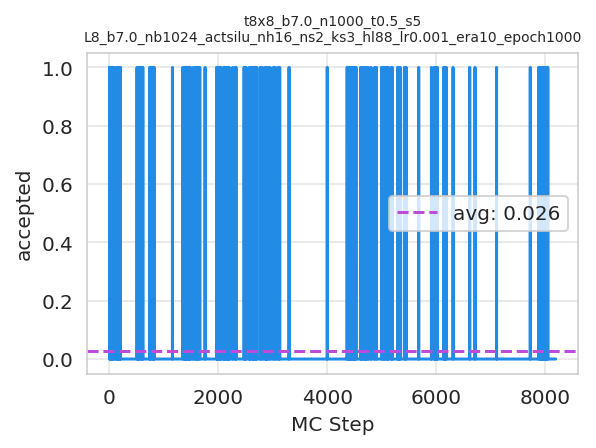

In [9]:
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
#from fthmc.utils.samplers import make_mcmc_ensemble
from fthmc.utils.inference import U1GaugeAction, make_mcmc_ensemble
from torch.utils.tensorboard import SummaryWriter

NUM_SAMPLES = 8192

logger.rule(f'Running inference on trained model for '
            f'{NUM_SAMPLES} samples')

model = train_outputs['model']
#action_fn = qed.BatchAction(train_config.beta)
action_fn = U1GaugeAction(train_config.beta)
logdir = train_config.logdir

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
inf_sdir = os.path.join(inf_dir, 'summaries')

writer = SummaryWriter(log_dir=inf_sdir)

nb = train_config.batch_size
#model = train_outputs['model']
history = make_mcmc_ensemble(model,
                             #action=action_fn,
                             action_fn,
                             batch_size=nb, 
                             num_samples=NUM_SAMPLES,
                             writer=writer)
                                 #num_samples=NUM_SAMPLES,
                                 #writer=writer)
plot_history(history=history,
             hline=True,
             param=param, config=train_config, #skip=['epoch', 'x'],
             num_chains=4, therm_frac=0., xlabel='MC Step',
             outdir=inf_pdir)

[06:55:27]  slope 1 linear regression S = S_eff + -555.4236

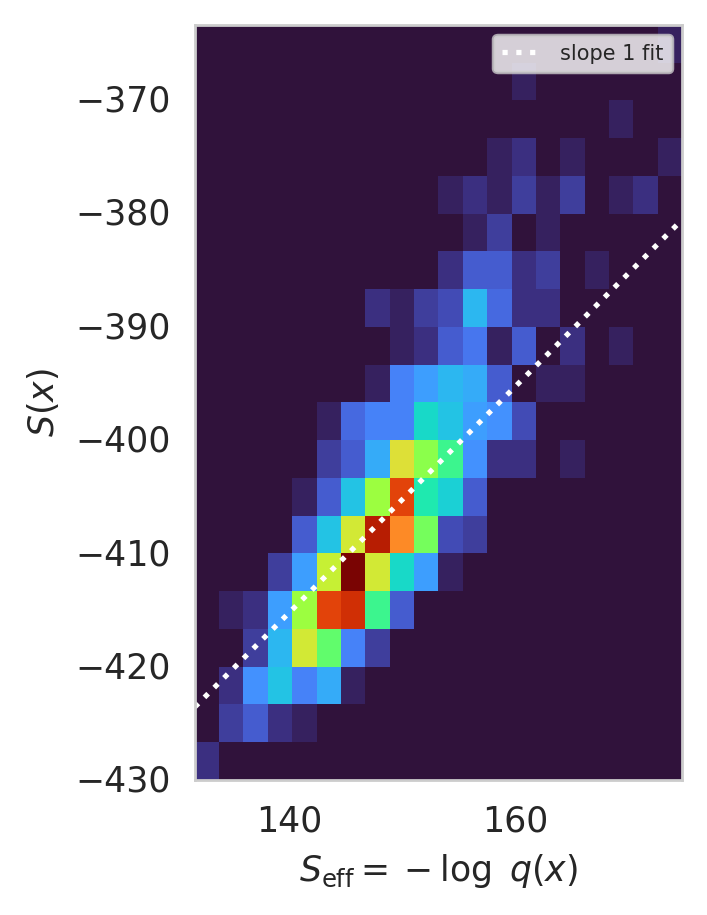

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/inference/plo
            ts/action_linear_regression.pdf

<Figure size 432x288 with 0 Axes>

In [10]:
from fthmc.config import grab
import fthmc.utils.qed_helpers as qed
from fthmc.utils.samplers import apply_flow_to_prior


model = train_outputs['model']
prior = model.prior
layers = model.layers

action = qed.BatchAction(train_config.beta)

x_, xi_, logq_ = apply_flow_to_prior(prior,
                                     layers,
                                     batch_size=1024)
x = grab(x_)
S_eff = -grab(logq_)
S = grab(action(x_))
#S = grab(phi4_action(torch_x))
fit_b = np.mean(S) - np.mean(S_eff)

logger.log(
    f'slope 1 linear regression S = S_eff + {fit_b:.4f}'
);

S_eff_lims = (np.min(S_eff), np.max(S_eff))
S_lims = (np.min(S), np.max(S))
axrange = [S_eff_lims, S_lims]

fig, ax = plt.subplots(1,1, dpi=125, figsize=(4,4))
ax.hist2d(S_eff, S, bins=20, cmap='turbo', range=axrange)

          #range=[[150, 195], [-230, -195]]);
ax.set_xlabel(r'$S_{\mathrm{eff}} = -\log~q(x)$');
ax.set_ylabel(r'$S(x)$');
ax.set_aspect('equal');
xs = np.linspace(np.min(S_eff), np.max(S_eff),
                 num=4, endpoint=True)
ax.plot(xs, xs + fit_b, ':',
        color='w', label='slope 1 fit');
plt.legend(prop={'size': 6});
plt.show();
outfile = os.path.join(inf_pdir,
                       'action_linear_regression.pdf')
logger.log(f'Saving figure to: {outfile}')
plt.savefig(outfile, dpi=250, bbox_inches='tight');

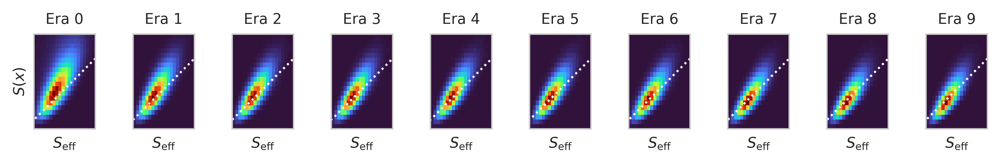

In [11]:
history = train_outputs['history']
n_era = train_config.n_era

fig, axes = plt.subplots(1, 10, dpi=250, sharey=True, figsize=(10, 1))
                         #constrained_layout=True)

logq_hist = np.array(history['logq']).reshape(n_era, -1)[::n_era//10]
logp_hist = np.array(history['logp']).reshape(n_era, -1)[::n_era//10]

for i, (ax, logq, logp) in enumerate(zip(axes, logq_hist, logp_hist)):
    ax.hist2d(-logq, -logp, bins=20, range=axrange, cmap='turbo');
    xs = np.linspace(np.min(-logq), np.max(-logq),
                     num=4, endpoint=True)
    ax.plot(xs, xs + fit_b, ':', lw=1.2,
            color='w', label='slope 1 fit');
    if i == 0:
        ax.set_ylabel(r'$S(x)$', fontsize='small');
    ax.set_xlabel(r'$S_{\mathrm{eff}}$', fontsize='small');
    ax.set_title(f'Era {i * (n_era//10)}', fontsize='small');
    ax.set_xticks([]);
    ax.set_yticks([]);
    #ax.legend(prop={'size': 6});
    ax.set_aspect('equal');
plt.show();

## Run `FieldTransformation` HMC with trained model

───────────────────────────────────────── nstep: 2 ──────────────────────────────────────────

───────────────────── Running `ftHMC` using trained flow for 1024 trajs ─────────────────────

[06:56:46]  Running ftHMC with tau=0.1, nsteps=2

            plaq=0.729 q=0.000

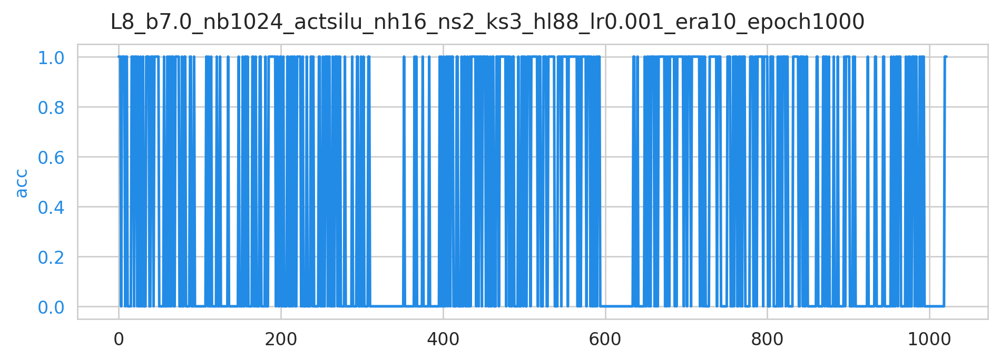

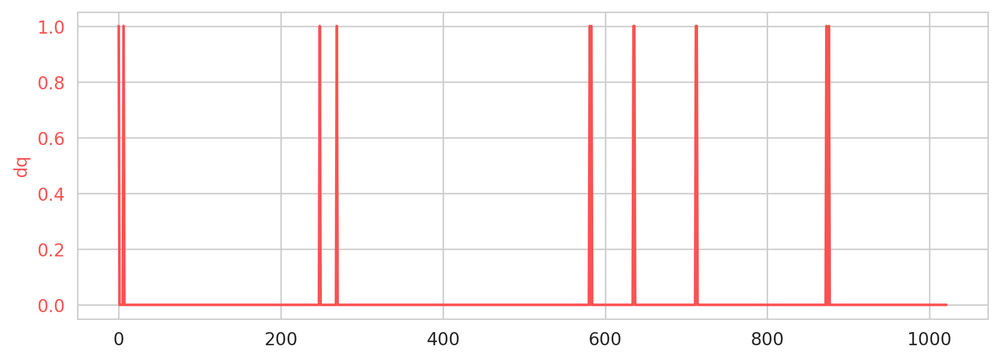

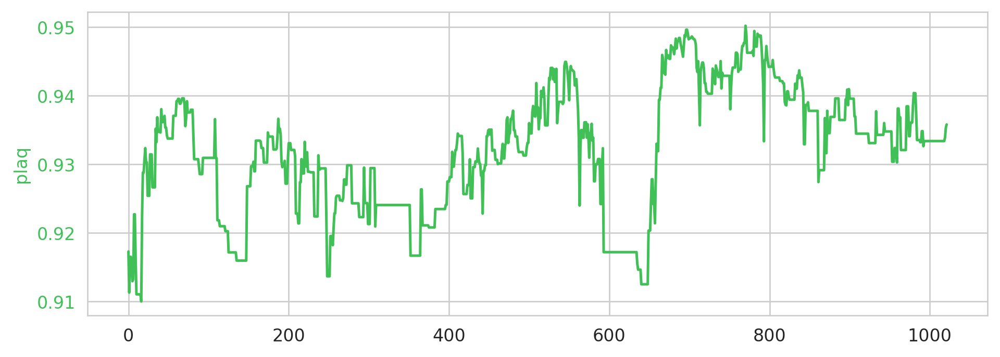

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/field_transformation.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[06:56:47]  traj=0 dt=0.274 acc=1.000 dh=0.339 plaq=0.917 q=1.000 dq=1.000

[06:57:01]  traj=50 dt=0.191 acc=0.000 dh=2.312 plaq=0.934 q=-0.000 dq=0.000

[06:57:15]  traj=100 dt=0.192 acc=0.000 dh=3.157 plaq=0.931 q=0.000 dq=0.000

[06:57:30]  traj=150 dt=0.192 acc=0.000 dh=3.158 plaq=0.927 q=0.000 dq=0.000

[06:57:44]  traj=200 dt=0.192 acc=1.000 dh=0.495 plaq=0.933 q=0.000 dq=0.000

[06:57:59]  traj=250 dt=0.192 acc=0.000 dh=10.333 plaq=0.914 q=1.000 dq=0.000

[06:58:13]  traj=300 dt=0.192 acc=0.000 dh=3.259 plaq=0.921 q=-0.000 dq=0.000

[06:58:28]  traj=350 dt=0.192 acc=0.000 dh=3.807 plaq=0.924 q=0.000 dq=0.000

[06:58:43]  traj=400 dt=0.192 acc=0.000 dh=7.413 plaq=0.927 q=-0.000 dq=0.000

[06:58:58]  traj=450 dt=0.192 acc=1.000 dh=-0.687 plaq=0.935 q=0.000 dq=0.000

[06:59:12]  traj=500 dt=0.192 acc=1.000 dh=-0.762 plaq=0.936 q=0.000 dq=0.000

[06:59:27]  traj=550 dt=0.193 acc=1.000 dh=-0.909 plaq=0.939 q=-0.000 dq=0.000

[06:59:41]  traj=600 dt=0.193 acc=0.000 dh=7.195 plaq=0.917 q=0.000 dq=0.000

[06:59:56]  traj=650 dt=0.193 acc=0.000 dh=0.892 plaq=0.920 q=-0.000 dq=0.000

[07:00:11]  traj=700 dt=0.193 acc=1.000 dh=-0.366 plaq=0.948 q=-0.000 dq=0.000

[07:00:26]  traj=750 dt=0.193 acc=0.000 dh=1.021 plaq=0.943 q=0.000 dq=0.000

[07:00:41]  traj=800 dt=0.193 acc=1.000 dh=0.418 plaq=0.944 q=-0.000 dq=0.000

[07:00:56]  traj=850 dt=0.193 acc=0.000 dh=8.753 plaq=0.938 q=0.000 dq=0.000

[07:01:10]  traj=900 dt=0.196 acc=1.000 dh=-0.107 plaq=0.940 q=0.000 dq=0.000

[07:01:25]  traj=950 dt=0.193 acc=0.000 dh=5.806 plaq=0.935 q=-0.000 dq=0.000

[07:01:40]  traj=1000 dt=0.193 acc=0.000 dh=1.108 plaq=0.933 q=0.000 dq=0.000

[07:01:47]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2_dt0.05/plots

[07:01:47]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.
            1_s2_dt0.05/plots

[07:01:48]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/traj.png

[07:01:49]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/dt.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/acc.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/dh.png

[07:01:50]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/plaq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/q.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/dq.png

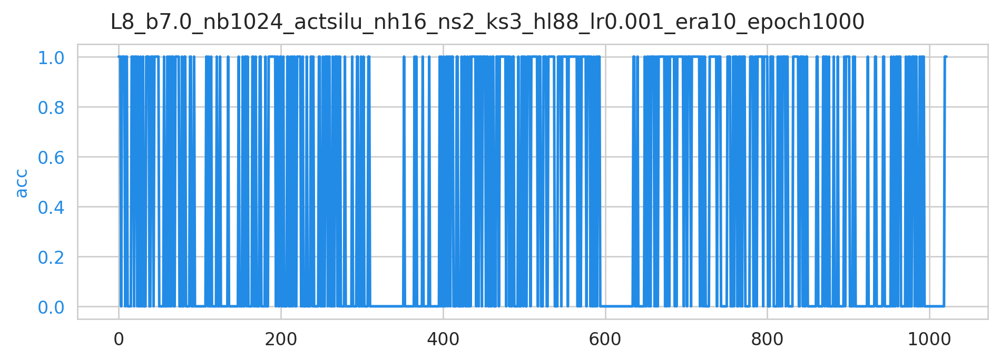

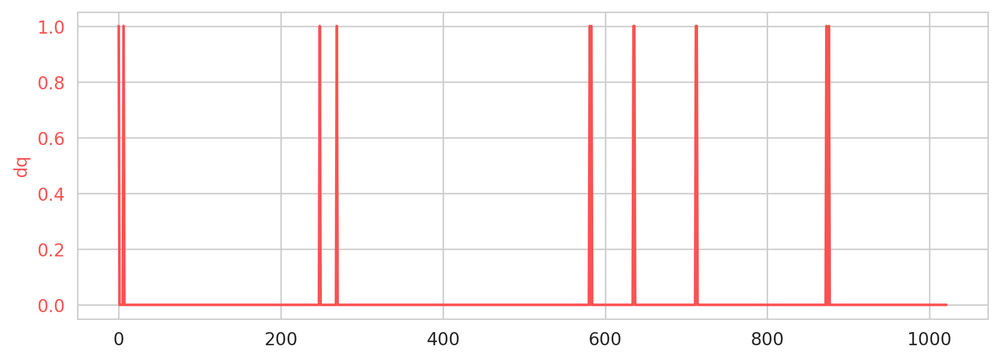

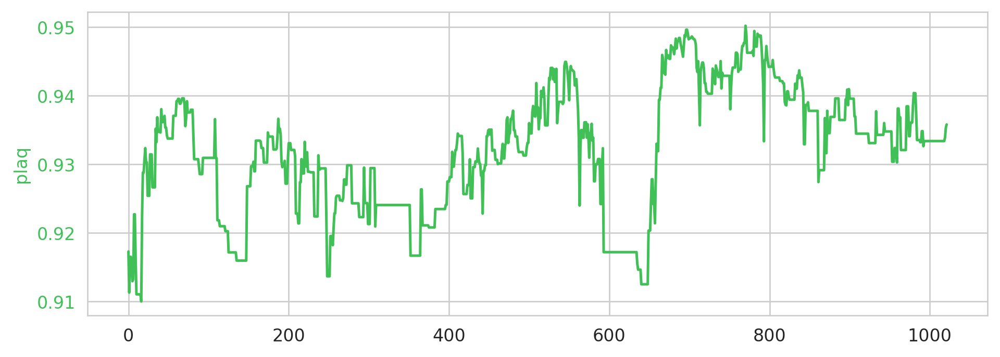

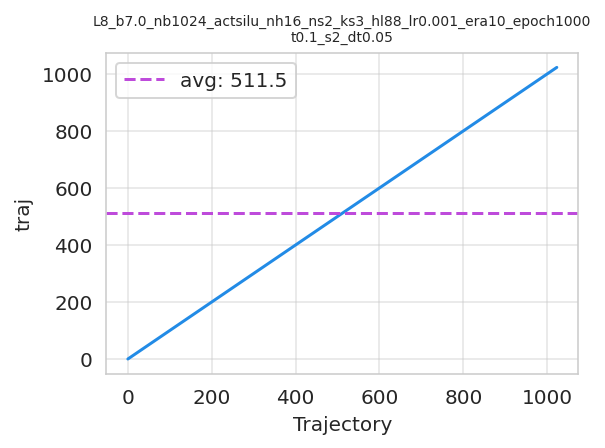

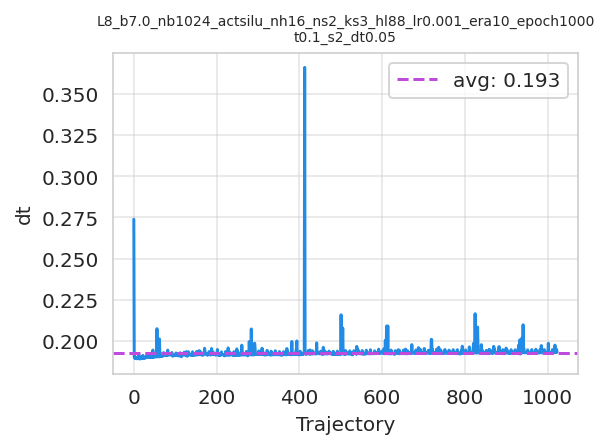

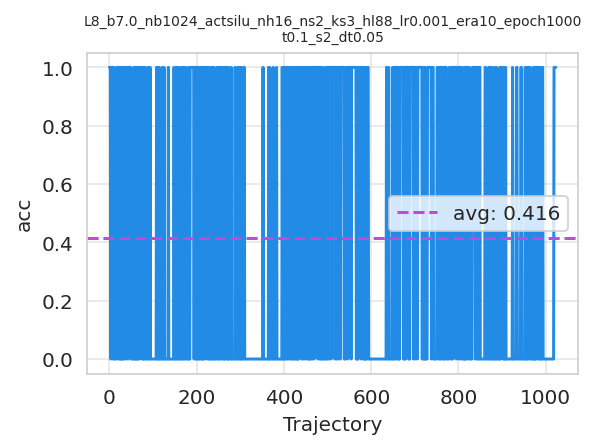

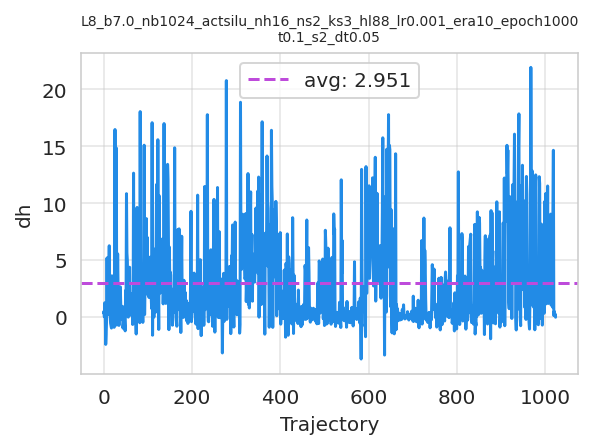

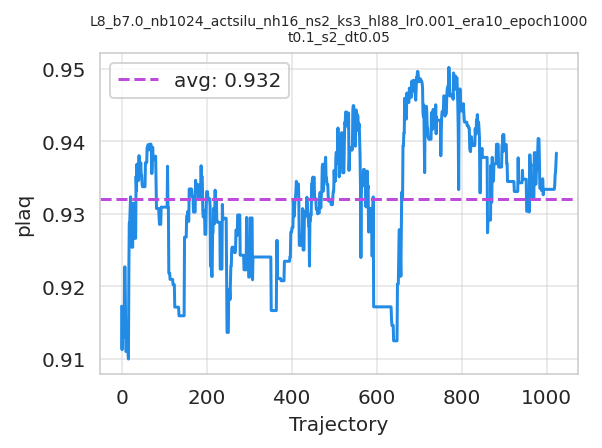

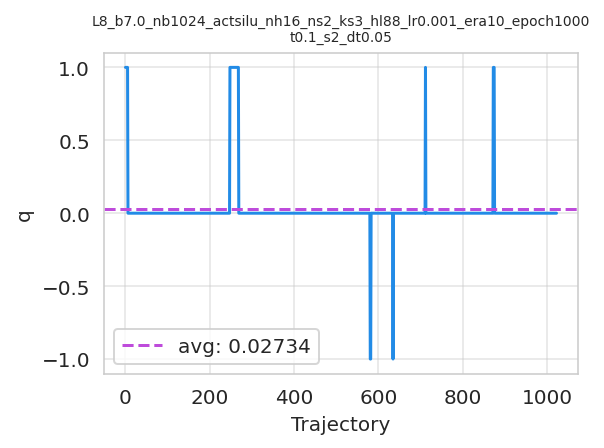

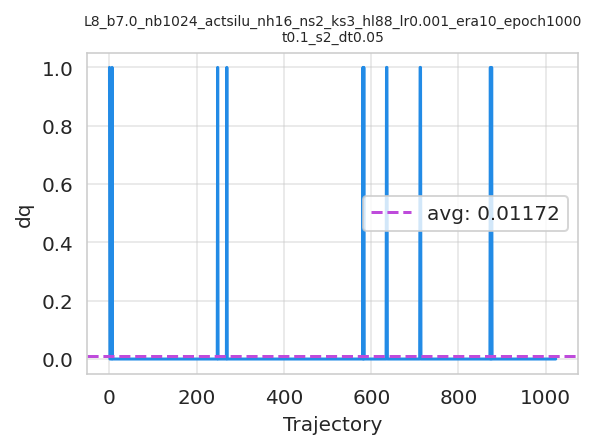

───────────────────────────────────────── nstep: 5 ──────────────────────────────────────────

───────────────────── Running `ftHMC` using trained flow for 1024 trajs ─────────────────────

[07:01:52]  Running ftHMC with tau=0.1, nsteps=5

            plaq=0.725 q=1.000

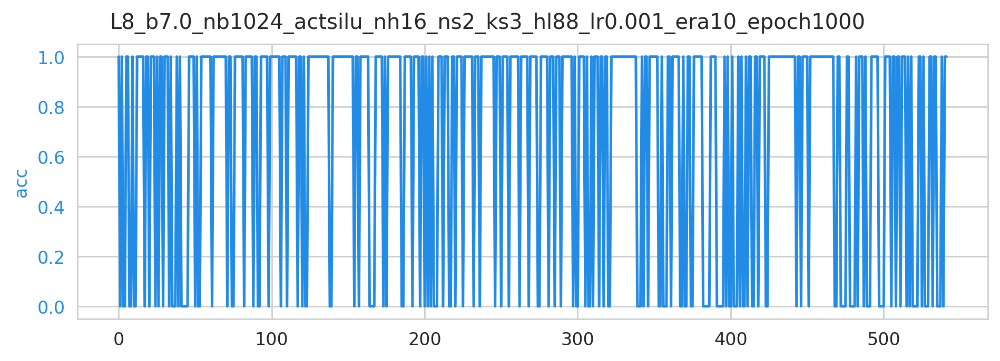

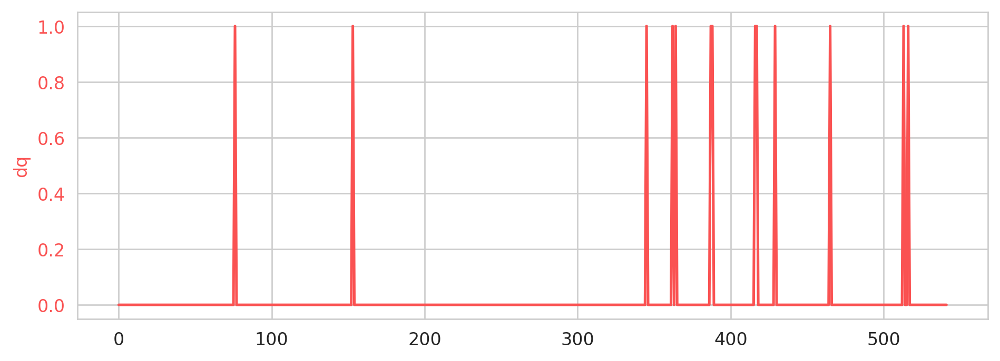

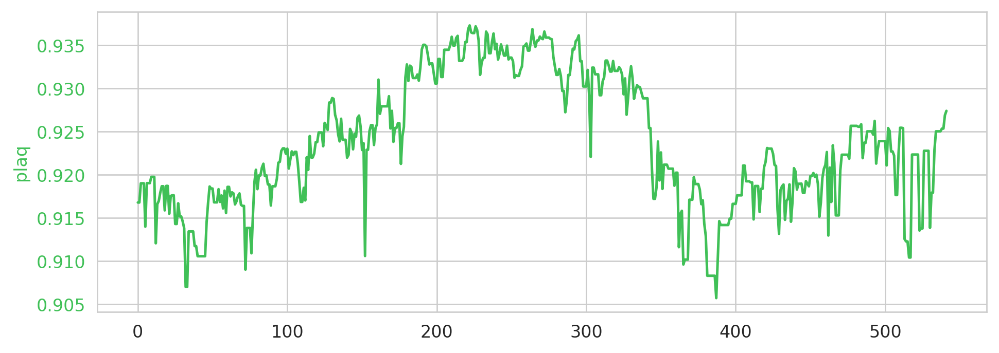

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/field_transformation.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[07:01:53]  traj=0 dt=0.442 acc=1.000 dh=0.295 plaq=0.917 q=1.000 dq=0.000

[07:02:18]  traj=50 dt=0.413 acc=0.000 dh=0.203 plaq=0.918 q=1.000 dq=0.000

[07:02:43]  traj=100 dt=0.409 acc=1.000 dh=0.200 plaq=0.923 q=0.000 dq=0.000

[07:03:09]  traj=150 dt=0.416 acc=1.000 dh=-0.103 plaq=0.923 q=0.000 dq=0.000

[07:03:34]  traj=200 dt=0.410 acc=0.000 dh=4.702 plaq=0.931 q=-1.000 dq=0.000

[07:04:00]  traj=250 dt=0.410 acc=0.000 dh=0.449 plaq=0.934 q=-1.000 dq=0.000

[07:04:25]  traj=300 dt=0.416 acc=0.000 dh=6.855 plaq=0.930 q=-1.000 dq=0.000

[07:04:51]  traj=350 dt=0.411 acc=1.000 dh=-0.635 plaq=0.923 q=0.000 dq=0.000

[07:05:17]  traj=400 dt=0.410 acc=0.000 dh=1.748 plaq=0.917 q=0.000 dq=0.000

[07:05:42]  traj=450 dt=0.411 acc=1.000 dh=-0.418 plaq=0.920 q=-1.000 dq=0.000

[07:06:08]  traj=500 dt=0.410 acc=0.000 dh=0.331 plaq=0.924 q=0.000 dq=0.000

KeyboardInterrupt: 

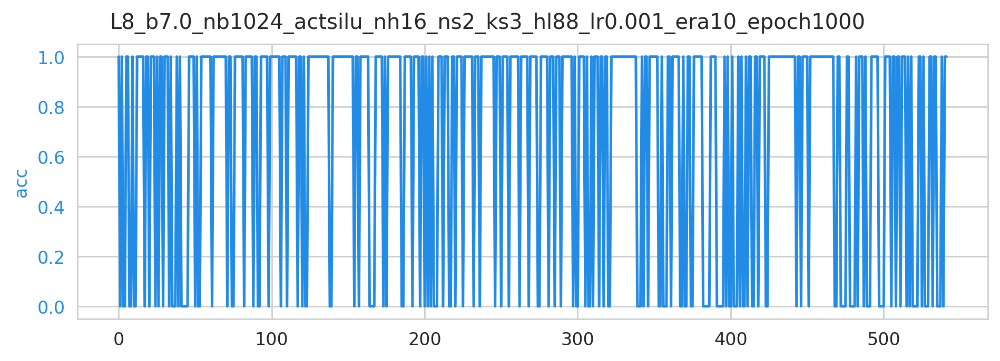

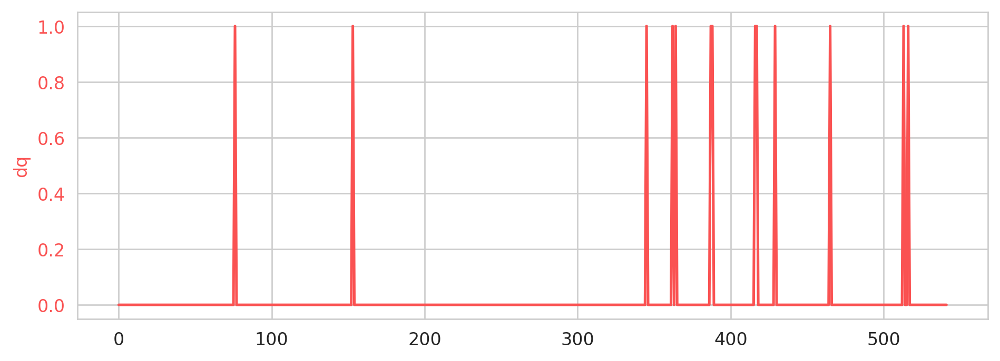

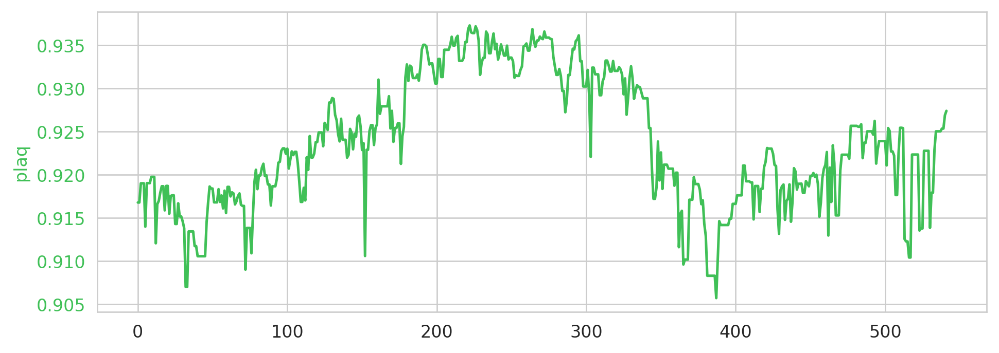

In [12]:
from fthmc.main import run_fthmc
from fthmc.config import ftConfig

#tau = 0.5
nstep_arr = [2, 5, 10, 15, 20]
fts = {}
dirs = {}
runs_histories = {}
flow = train_outputs['model'].layers
for tau in [0.1, 0.5, 1.0]:
    for nstep in nstep_arr:
        logger.rule(f'nstep: {nstep}')
        ftconfig = ftConfig(tau=tau, nstep=nstep)
        fthmc_outputs = run_fthmc(flow=flow,
                                  num_trajs=1024,
                                  config=train_config,
                                  ftconfig=ftconfig)



#  Transfer to larger lattice


──────────────────────── Transferring trained model to 16x16 lattice ────────────────────────

───────────────────── Running HMC for 1 runs, each of 1000 trajectories ─────────────────────

[07:07:55 AM]  Creating directory:                                                           
               ../../logs/hmc/lat16x16/beta7.0/t16x16_b7.0_n1000_t0.5_s5/plots

[07:07:55 AM]  Param:                                                                        
               ----------------                                                              
               beta=7.0                                                                      
               L=16                                                                          
               tau=0.5                                                                       
               nstep=5                                                                       
               ntraj=1000                                                                    
               nrun=1                                                                        
               nprint=100                                                                    
               seed=1331                                                                     
               randinit=False                                                                
               nth_interop=2                                                                 
               nth=2                                                                         
               lat=[16, 16]                                                                  
               nd=2                                                                          
               shape=[2, 16, 16]                                                             
               volume=256                                                                    
               dt=0.1                                                                        
               logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/beta7.0/t16x16
               _b7.0_n1000_t0.5_s5

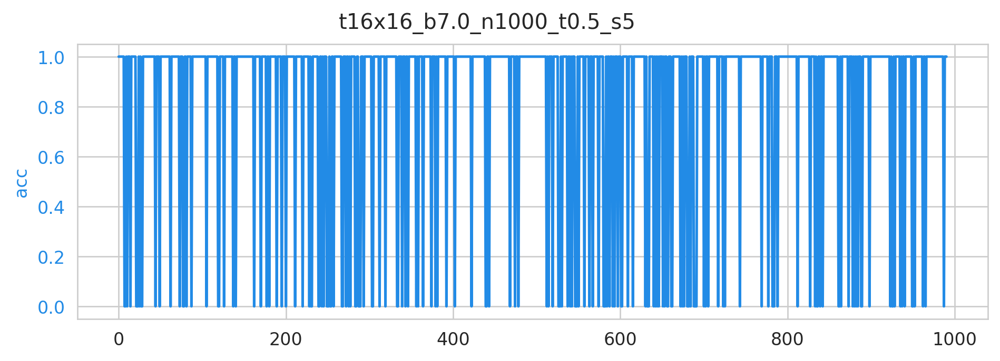

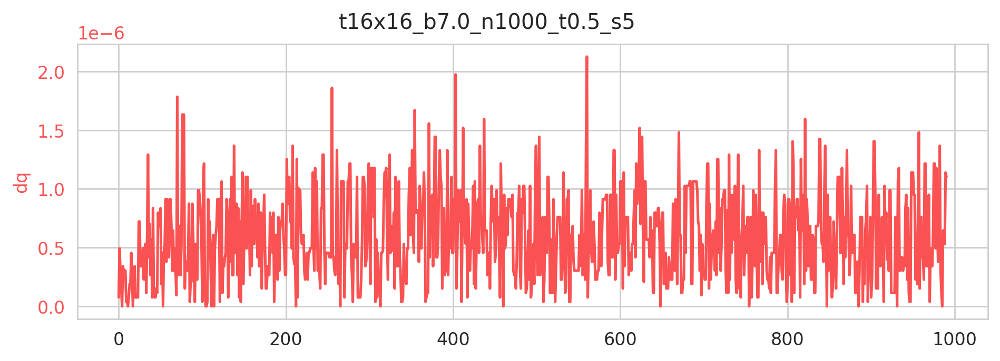

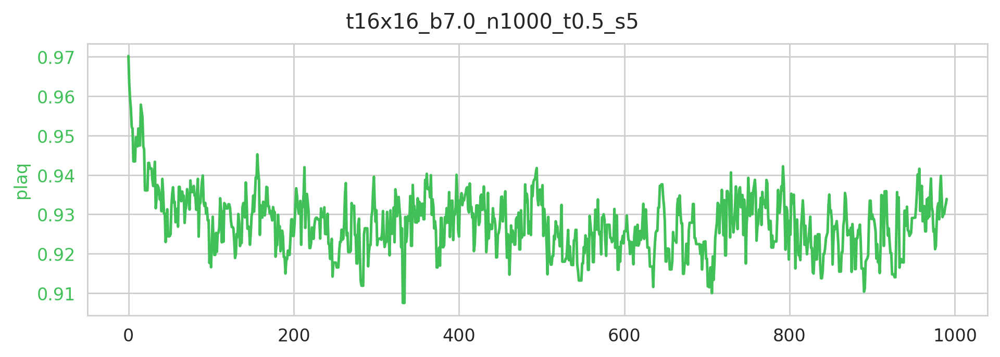

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

[07:07:56 AM]  plaq=1.000 q=0.000

               traj=2 dt=0.004 acc=1.000 dH=-0.988 plaq=0.963 q=0 dq=0.000

[07:08:03 AM]  traj=102 dt=0.004 acc=1.000 dH=0.701 plaq=0.924 q=0 dq=0.000

[07:08:09 AM]  traj=202 dt=0.005 acc=1.000 dH=0.398 plaq=0.928 q=0 dq=0.000

[07:08:16 AM]  traj=302 dt=0.004 acc=1.000 dH=-0.504 plaq=0.922 q=0 dq=0.000

[07:08:23 AM]  traj=402 dt=0.004 acc=1.000 dH=1.190 plaq=0.934 q=0 dq=0.000

[07:08:29 AM]  traj=502 dt=0.004 acc=1.000 dH=0.444 plaq=0.937 q=0 dq=0.000

[07:08:36 AM]  traj=602 dt=0.004 acc=0.000 dH=0.410 plaq=0.926 q=0 dq=0.000

[07:08:44 AM]  traj=702 dt=0.004 acc=1.000 dH=-0.796 plaq=0.912 q=0 dq=0.000

[07:08:52 AM]  traj=802 dt=0.004 acc=1.000 dH=-0.120 plaq=0.925 q=0 dq=0.000

[07:08:59 AM]  traj=902 dt=0.004 acc=1.000 dH=0.043 plaq=0.929 q=0 dq=0.000

[07:09:05 AM]  Creating directory:                                                           
               ../../logs/hmc/lat16x16/beta7.0/t16x16_b7.0_n1000_t0.5_s5/plots/run0

[07:09:05 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/bet
               a7.0/t16x16_b7.0_n1000_t0.5_s5/plots/run0/traj.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/bet
               a7.0/t16x16_b7.0_n1000_t0.5_s5/plots/run0/dt.png

[07:09:06 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/bet
               a7.0/t16x16_b7.0_n1000_t0.5_s5/plots/run0/acc.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/bet
               a7.0/t16x16_b7.0_n1000_t0.5_s5/plots/run0/dH.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/bet
               a7.0/t16x16_b7.0_n1000_t0.5_s5/plots/run0/plaq.png

[07:09:07 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/bet
               a7.0/t16x16_b7.0_n1000_t0.5_s5/plots/run0/q.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/bet
               a7.0/t16x16_b7.0_n1000_t0.5_s5/plots/run0/dq.png

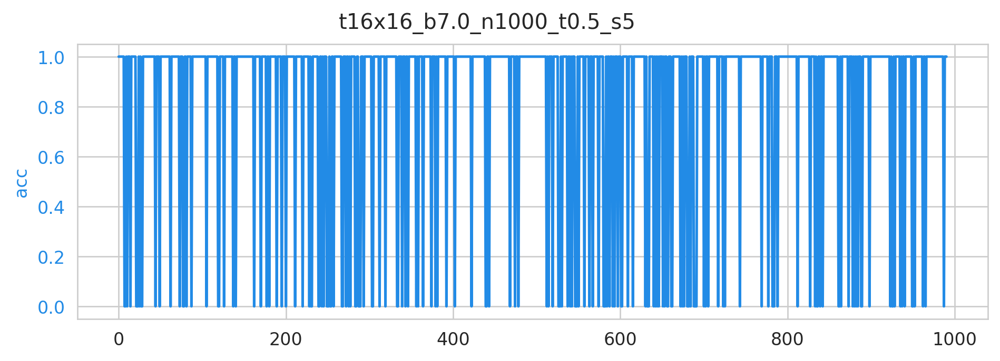

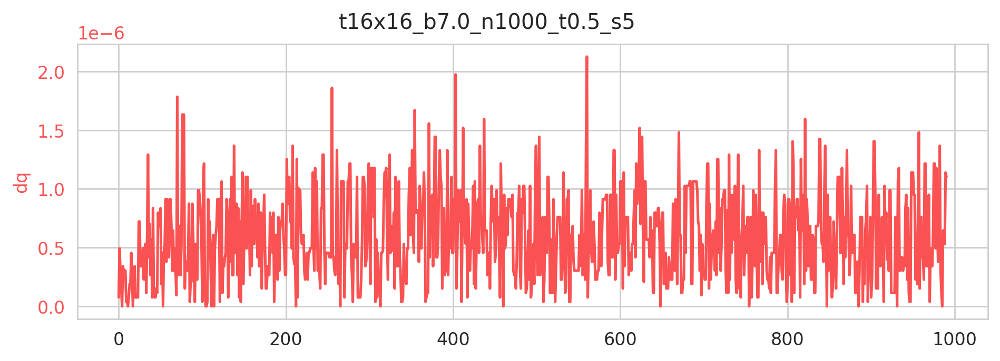

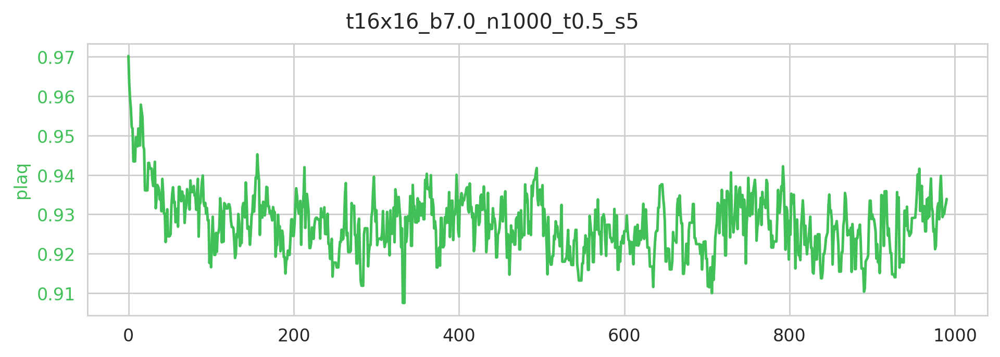

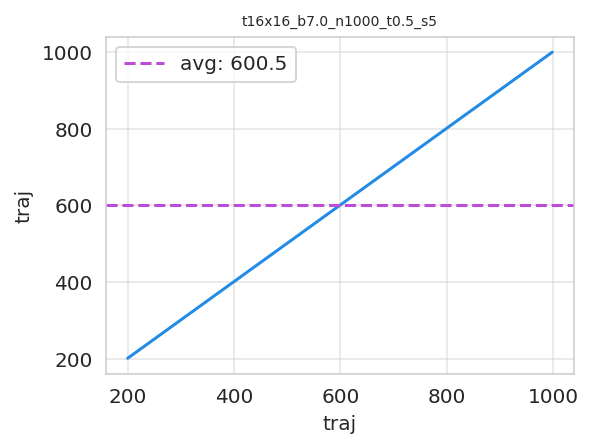

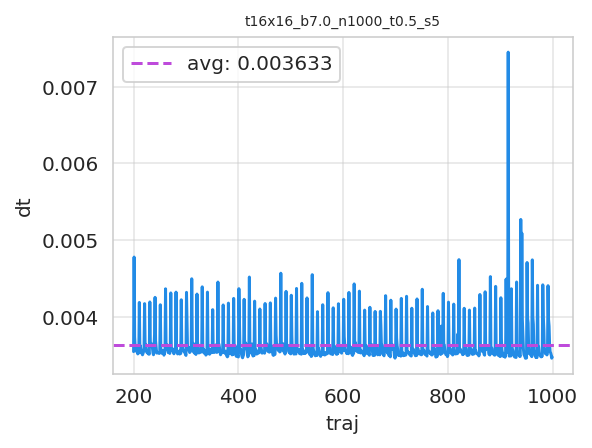

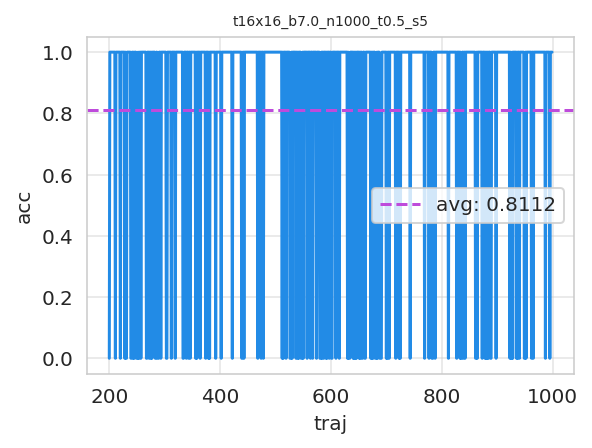

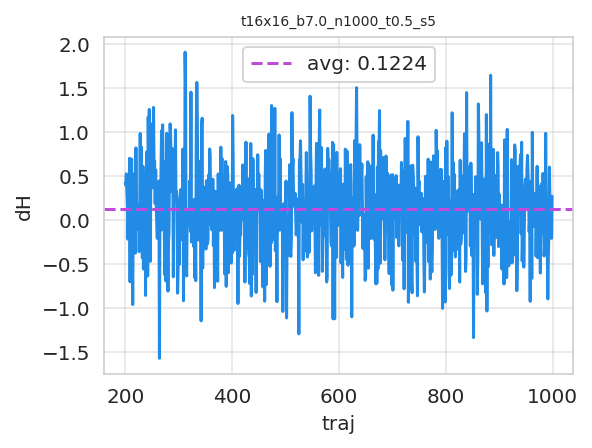

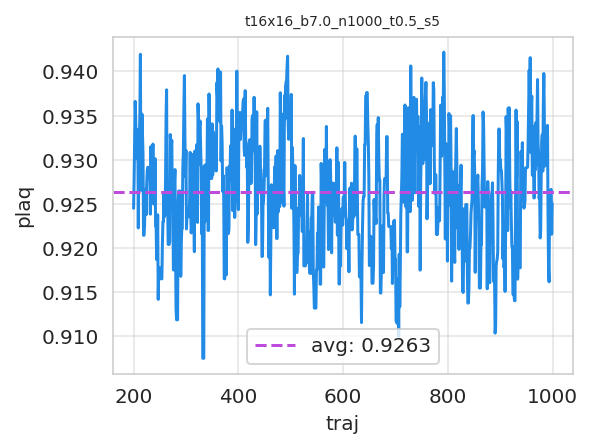

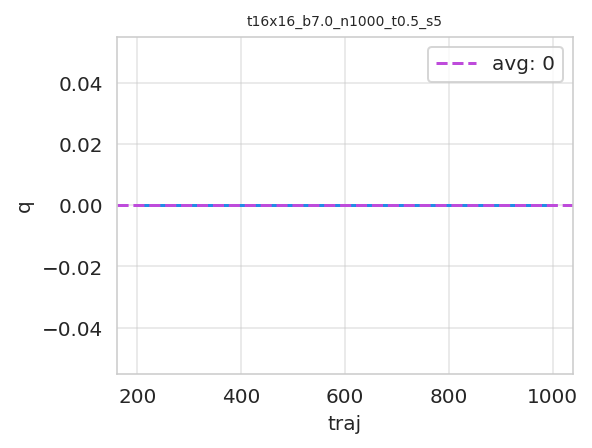

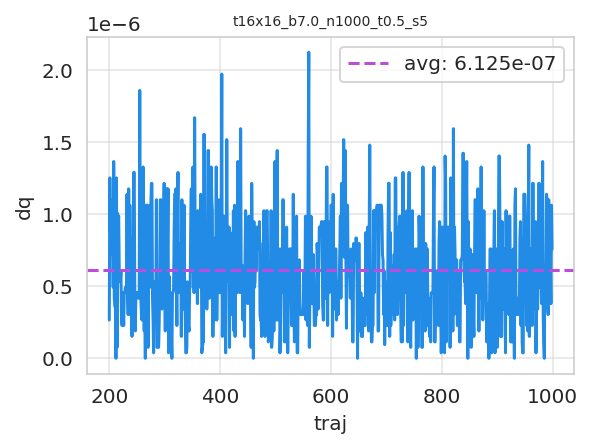

[07:09:09 AM]  Run times: ['69.6037']

               Per trajectory: ['0.0696']

[07:09:09 AM]  Saving hmc_histories to                                                       
               ../../logs/hmc/lat16x16/beta7.0/t16x16_b7.0_n1000_t0.5_s5/hmc_histories.z.

[07:09:09 AM]  Saving hmc_fields_arr to                                                      
               ../../logs/hmc/lat16x16/beta7.0/t16x16_b7.0_n1000_t0.5_s5/hmc_fields_arr.z.

──────────────────── Training FlowModel for 10 era, each of 1000 epochs ─────────────────────

[07:09:09 AM]  TrainConfig:                                                                  
               ------------                                                                  
               L=16                                                                          
               beta=7.0                                                                      
               restore=False                                                                 
               activation_fn=silu                                                            
               n_era=10                                                                      
               n_epoch=1000                                                                  
               batch_size=1024                                                               
               base_lr=0.001                                                                 
               n_s_nets=2                                                                    
               n_layers=16                                                                   
               kernel_size=3                                                                 
               with_force=False                                                              
               print_freq=500                                                                
               plot_freq=100                                                                 
               log_freq=100                                                                  
               hidden_sizes=[8, 8]                                                           
               lat=[16, 16]                                                                  
               nd=2                                                                          
               shape=[2, 16, 16]                                                             
               volume=256                                                                    
               logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7
               .0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x16/
               beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000     
               dirs:                                                                         
               -----                                                                         
               logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7
               .0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x16/
               beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000     
               training=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_
               b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x1
               6/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tr
               aining                                                                        
               inference=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8
               _b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x
               16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/i
               nference                                                                      
               ckpts=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7.
               0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x16/b
               eta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/train
               ing/checkpoints

[07:09:09 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x16/beta7.0/L16_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0709
               09

[07:09:09 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x16/beta7.0/L16_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0709
               09/plots

[07:09:09 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x16/beta7.0/L16_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0709
               09/checkpoints

[07:09:09 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x16/beta7.0/L16_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0709
               09/summaries

[07:09:09 AM]  Writing summaries to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/summaries

               Scheduler created!

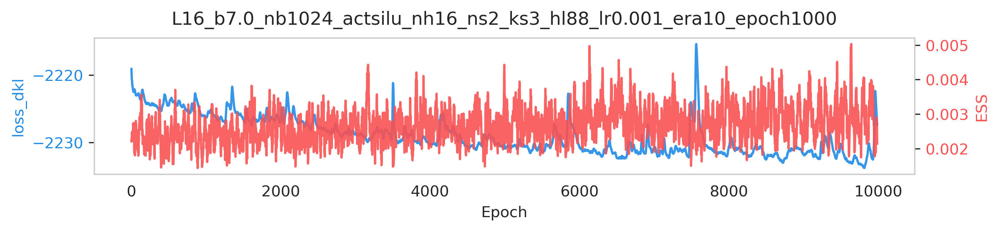

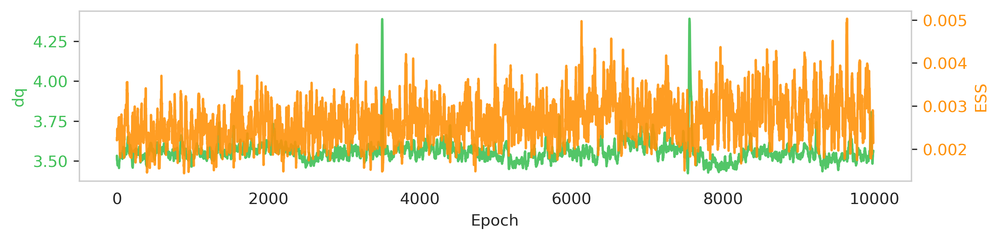

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[07:09:57 AM]  epoch=500 dt=0.088 ess=0.006 logp=1630.793 logq=-592.952 loss_dkl=-2223.745   
               dq=3.381 plaq=0.910

[07:10:45 AM]  epoch=1000 dt=0.095 ess=0.001 logp=1634.385 logq=-592.052 loss_dkl=-2226.437  
               dq=3.437 plaq=0.912

[07:10:45 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 1 min 35.76 sec ─────────────────────────────

[07:11:33 AM]  epoch=1500 dt=0.089 ess=0.002 logp=1634.681 logq=-591.345 loss_dkl=-2226.026  
               dq=3.533 plaq=0.912

[07:12:23 AM]  epoch=2000 dt=0.091 ess=0.007 logp=1635.784 logq=-591.051 loss_dkl=-2226.835  
               dq=3.403 plaq=0.913

[07:12:24 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 1 min 38.09 sec ─────────────────────────────

[07:13:13 AM]  epoch=2500 dt=0.091 ess=0.001 logp=1634.250 logq=-593.293 loss_dkl=-2227.542  
               dq=3.366 plaq=0.912

[07:14:02 AM]  epoch=3000 dt=0.090 ess=0.004 logp=1637.318 logq=-591.698 loss_dkl=-2229.016  
               dq=3.549 plaq=0.914

[07:14:03 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 1 min 38.49 sec ─────────────────────────────

[07:14:52 AM]  epoch=3500 dt=0.090 ess=0.002 logp=1640.588 logq=-588.602 loss_dkl=-2229.189  
               dq=3.663 plaq=0.916

[07:15:41 AM]  epoch=4000 dt=0.090 ess=0.003 logp=1638.856 logq=-591.540 loss_dkl=-2230.396  
               dq=3.583 plaq=0.915

[07:15:42 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 1 min 38.81 sec ─────────────────────────────

[07:16:32 AM]  epoch=4500 dt=0.090 ess=0.004 logp=1641.192 logq=-589.369 loss_dkl=-2230.562  
               dq=3.605 plaq=0.916

[07:17:21 AM]  epoch=5000 dt=0.090 ess=0.005 logp=1638.626 logq=-591.197 loss_dkl=-2229.823  
               dq=3.573 plaq=0.914

[07:17:21 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 1 min 38.31 sec ─────────────────────────────

[07:18:11 AM]  epoch=5500 dt=0.090 ess=0.002 logp=1640.969 logq=-590.475 loss_dkl=-2231.444  
               dq=3.632 plaq=0.916

[07:19:00 AM]  epoch=6000 dt=0.090 ess=0.002 logp=1638.455 logq=-592.016 loss_dkl=-2230.472  
               dq=3.655 plaq=0.914

[07:19:01 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 1 min 38.46 sec ─────────────────────────────

[07:19:51 AM]  epoch=6500 dt=0.090 ess=0.003 logp=1642.478 logq=-589.653 loss_dkl=-2232.131  
               dq=3.609 plaq=0.917

[07:20:40 AM]  epoch=7000 dt=0.090 ess=0.001 logp=1639.845 logq=-590.376 loss_dkl=-2230.222  
               dq=3.833 plaq=0.915

[07:20:41 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 1 min 38.61 sec ─────────────────────────────

[07:21:31 AM]  epoch=7500 dt=0.090 ess=0.001 logp=1632.771 logq=-590.780 loss_dkl=-2223.551  
               dq=3.518 plaq=0.911

[07:22:20 AM]  epoch=8000 dt=0.090 ess=0.004 logp=1640.529 logq=-590.140 loss_dkl=-2230.669  
               dq=3.561 plaq=0.915

[07:22:21 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 1 min 38.83 sec ─────────────────────────────

[07:23:11 AM]  epoch=8500 dt=0.090 ess=0.001 logp=1641.444 logq=-590.714 loss_dkl=-2232.158  
               dq=3.535 plaq=0.916

[07:24:00 AM]  epoch=9000 dt=0.090 ess=0.001 logp=1643.290 logq=-588.415 loss_dkl=-2231.705  
               dq=3.554 plaq=0.917

[07:24:01 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 1 min 38.2 sec ──────────────────────────────

[07:24:53 AM]  epoch=9500 dt=0.092 ess=0.003 logp=1636.925 logq=-592.608 loss_dkl=-2229.533  
               dq=3.621 plaq=0.913

[07:25:43 AM]  epoch=10000 dt=0.091 ess=0.001 logp=1639.572 logq=-588.709 loss_dkl=-2228.281 
               dq=3.531 plaq=0.915

[07:25:44 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/checkpoints/ckpt-era9-epoch999.tar

[07:25:46 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/checkpoints/ckpt-era10-epoch1001.tar

[07:25:48 AM]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-070909/plots

[07:25:49 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-070909/plots/dt.png

[07:25:50 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-070909/plots/ess.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-070909/plots/logp.png

[07:25:51 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-070909/plots/logq.png

[07:25:52 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-070909/plots/loss_dkl.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-070909/plots/q.png

[07:25:53 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-070909/plots/dq.png

[07:25:54 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-070909/plots/plaq.png

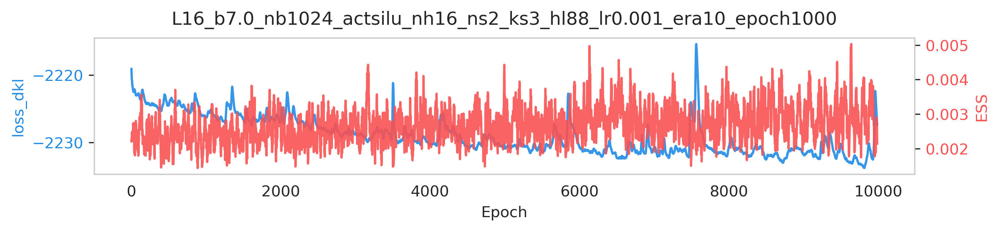

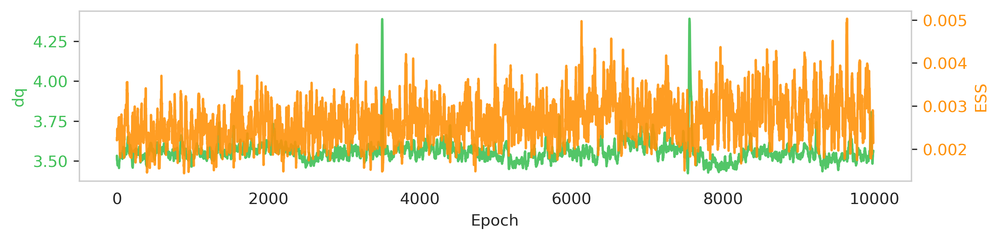

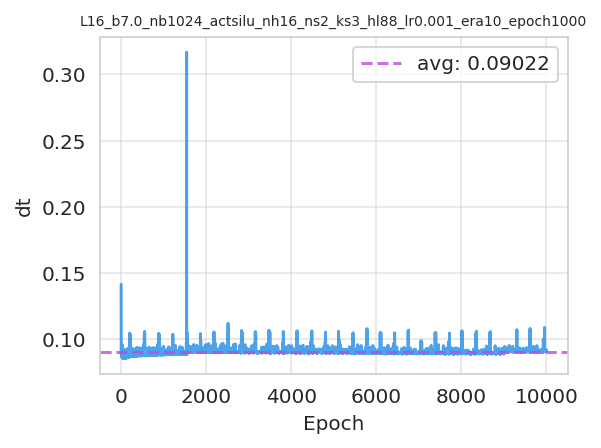

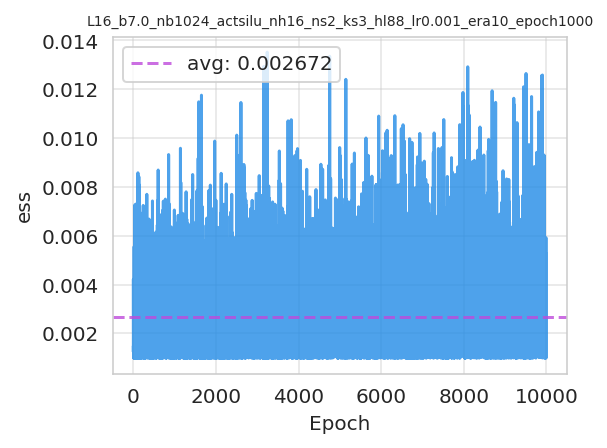

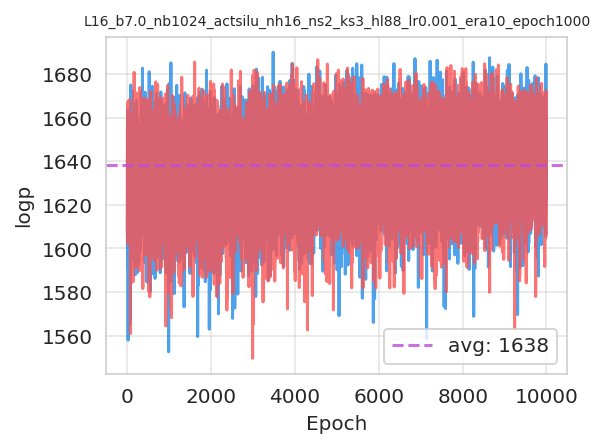

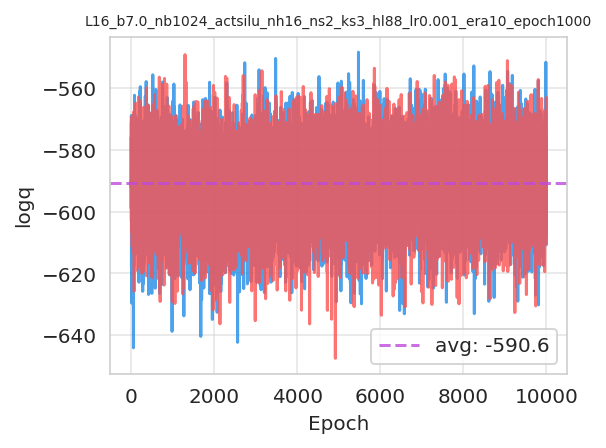

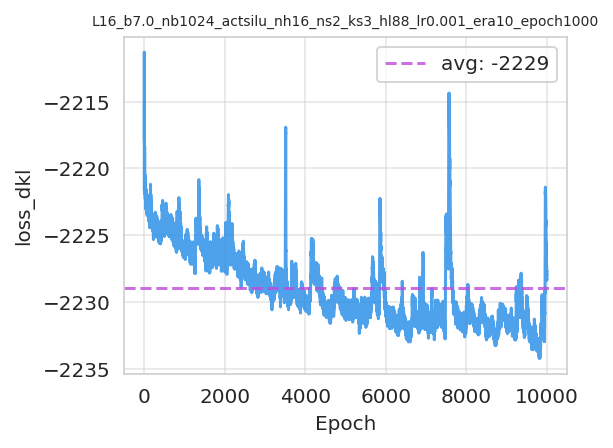

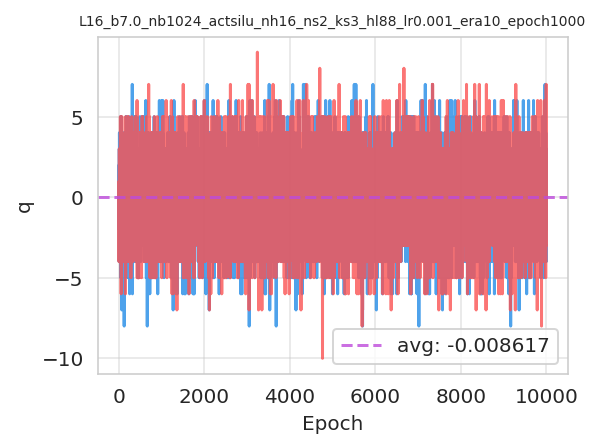

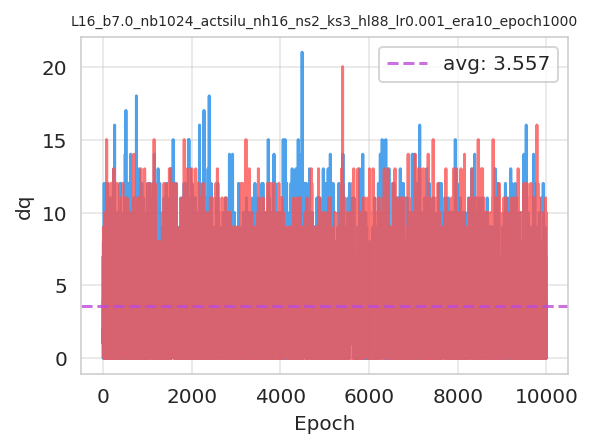

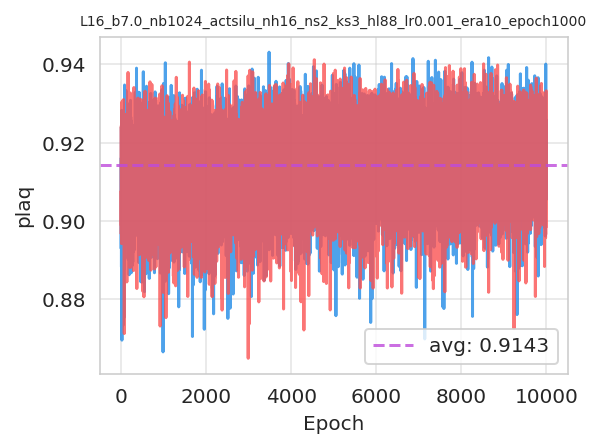

[07:25:57 AM]  Saving train_history to ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsil
               u_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x16/beta7.0/L16_b7.0
               _nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-
               070909/train_history.z.

─────────────────────── Using trained model to generate 8192 samples ────────────────────────

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/utils/inference.py:116: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[07:26:11 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x16/beta7.0/L16_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/inference/plots

[07:26:11 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/inference/plots/logq.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/inference/plots/logp.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/inference/plots/accepted.png

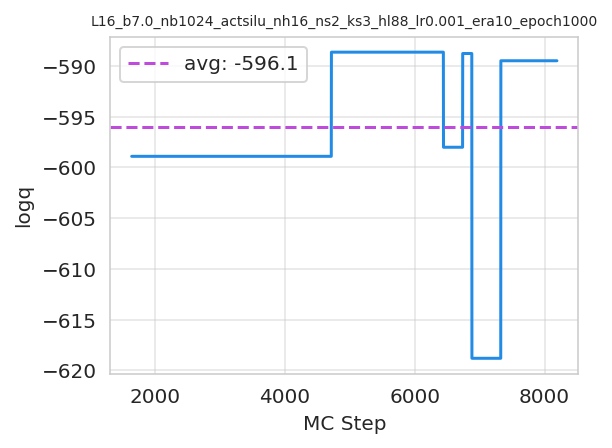

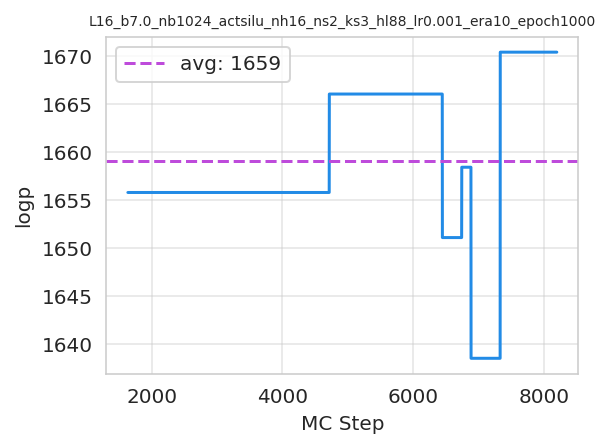

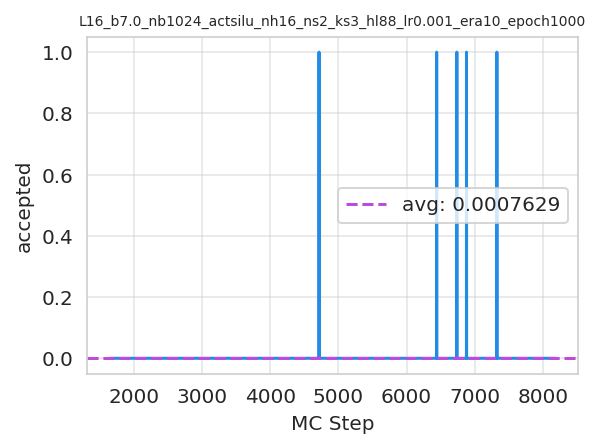

───────────────────── Running `ftHMC` using trained flow for 1024 trajs ─────────────────────

[07:26:12 AM]  Running ftHMC with tau=1.0, nsteps=10

               plaq=0.719 q=4.000

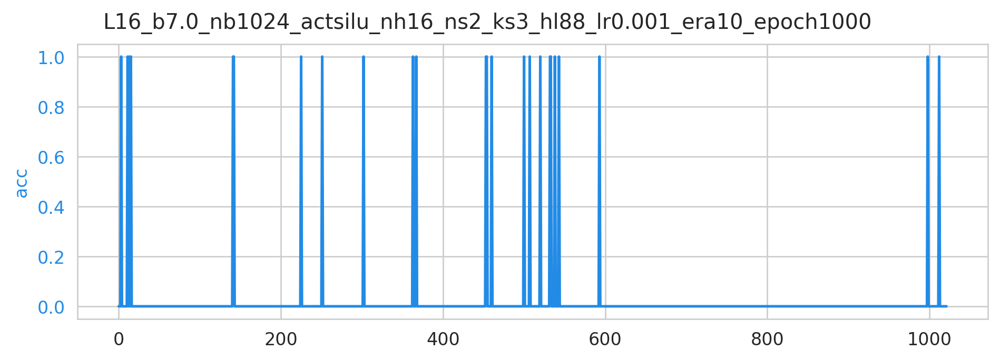

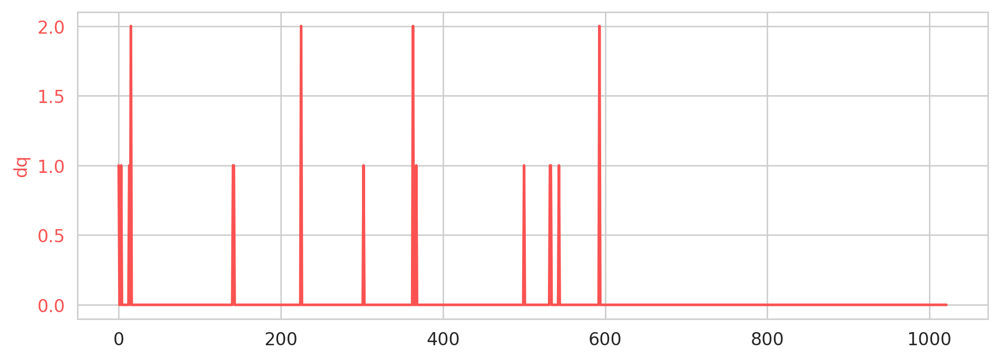

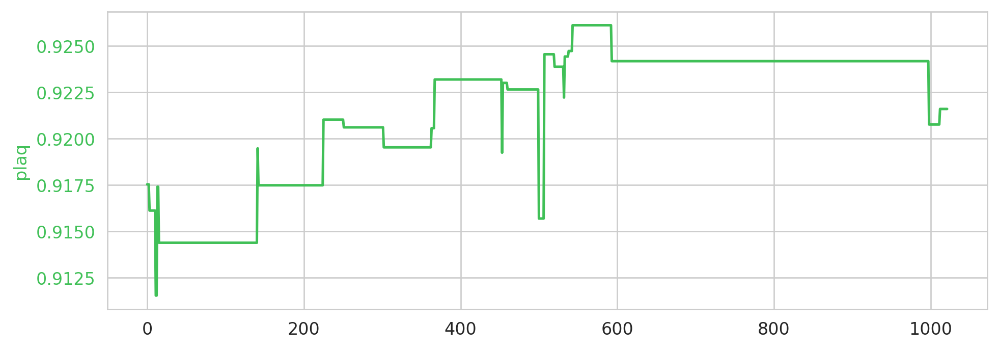

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/field_transformation.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[07:26:14 AM]  traj=0 dt=0.903 acc=0.000 dh=6.067 plaq=0.918 q=3.000 dq=1.000

[07:26:59 AM]  traj=50 dt=0.808 acc=0.000 dh=11.534 plaq=0.914 q=3.000 dq=0.000

[07:27:44 AM]  traj=100 dt=0.806 acc=0.000 dh=13.315 plaq=0.914 q=3.000 dq=0.000

[07:28:29 AM]  traj=150 dt=0.813 acc=0.000 dh=21.362 plaq=0.917 q=3.000 dq=0.000

[07:29:14 AM]  traj=200 dt=0.815 acc=0.000 dh=18.929 plaq=0.917 q=3.000 dq=0.000

[07:30:00 AM]  traj=250 dt=0.811 acc=0.000 dh=11.944 plaq=0.921 q=1.000 dq=0.000

[07:30:45 AM]  traj=300 dt=0.811 acc=0.000 dh=13.416 plaq=0.921 q=1.000 dq=0.000

[07:31:30 AM]  traj=350 dt=0.811 acc=0.000 dh=19.273 plaq=0.920 q=2.000 dq=0.000

[07:32:16 AM]  traj=400 dt=0.812 acc=0.000 dh=17.990 plaq=0.923 q=1.000 dq=0.000

[07:33:02 AM]  traj=450 dt=0.813 acc=0.000 dh=16.538 plaq=0.923 q=1.000 dq=0.000

[07:33:47 AM]  traj=500 dt=0.814 acc=1.000 dh=1.676 plaq=0.916 q=0.000 dq=1.000

[07:34:33 AM]  traj=550 dt=0.817 acc=0.000 dh=4.061 plaq=0.926 q=-1.000 dq=0.000

[07:35:19 AM]  traj=600 dt=0.841 acc=0.000 dh=17.005 plaq=0.924 q=1.000 dq=0.000

[07:36:07 AM]  traj=650 dt=0.815 acc=0.000 dh=19.803 plaq=0.924 q=1.000 dq=0.000

[07:36:53 AM]  traj=700 dt=0.816 acc=0.000 dh=26.260 plaq=0.924 q=1.000 dq=0.000

[07:37:40 AM]  traj=750 dt=0.815 acc=0.000 dh=14.143 plaq=0.924 q=1.000 dq=0.000

[07:38:28 AM]  traj=800 dt=0.816 acc=0.000 dh=33.259 plaq=0.924 q=1.000 dq=0.000

[07:39:13 AM]  traj=850 dt=0.814 acc=0.000 dh=25.032 plaq=0.924 q=1.000 dq=0.000

[07:39:59 AM]  traj=900 dt=0.814 acc=0.000 dh=11.138 plaq=0.924 q=1.000 dq=0.000

[07:40:45 AM]  traj=950 dt=0.824 acc=0.000 dh=25.227 plaq=0.924 q=1.000 dq=0.000

[07:41:32 AM]  traj=1000 dt=0.816 acc=0.000 dh=14.059 plaq=0.921 q=1.000 dq=0.000

[07:41:53 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x16/beta7.0/L16_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t1.0_s10_dt0.1/plo
               ts

[07:41:53 AM]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/ftHMC/t1.0_s10_dt0.1/plots

[07:41:54 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t1.0_s10_dt0.1/plots/traj.png

[07:41:55 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t1.0_s10_dt0.1/plots/dt.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t1.0_s10_dt0.1/plots/acc.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t1.0_s10_dt0.1/plots/dh.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t1.0_s10_dt0.1/plots/plaq.png

[07:41:56 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t1.0_s10_dt0.1/plots/q.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t1.0_s10_dt0.1/plots/dq.png

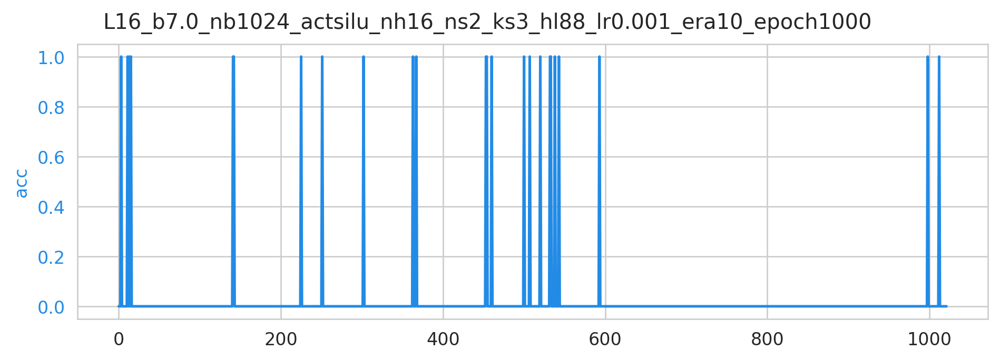

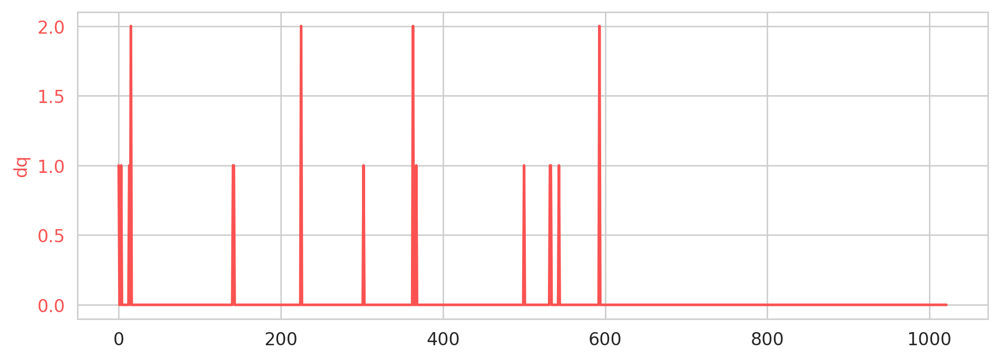

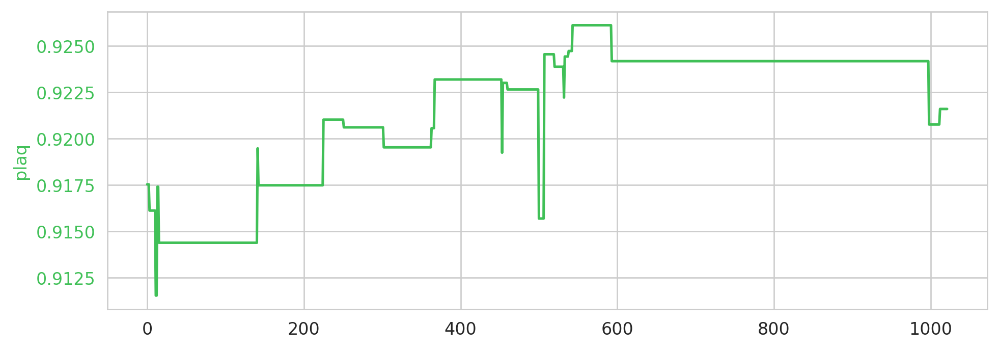

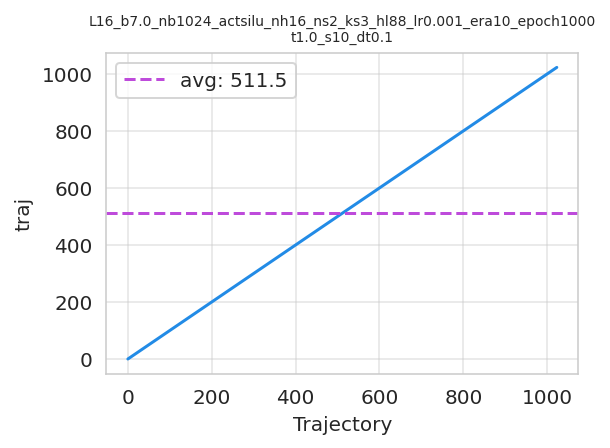

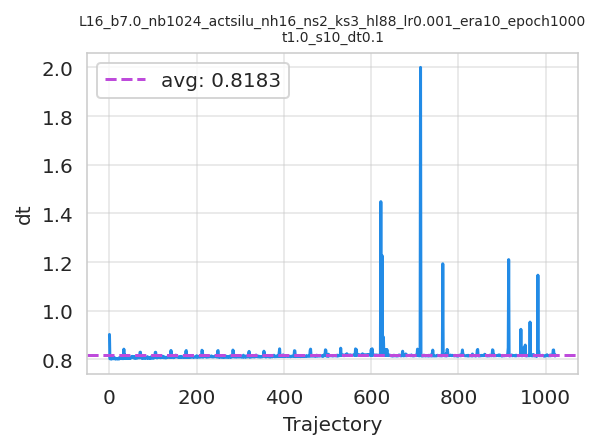

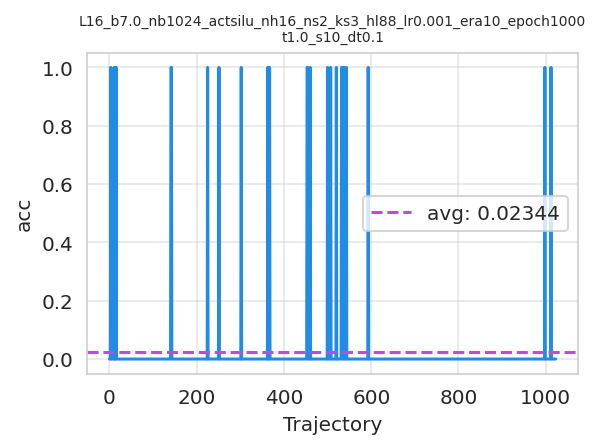

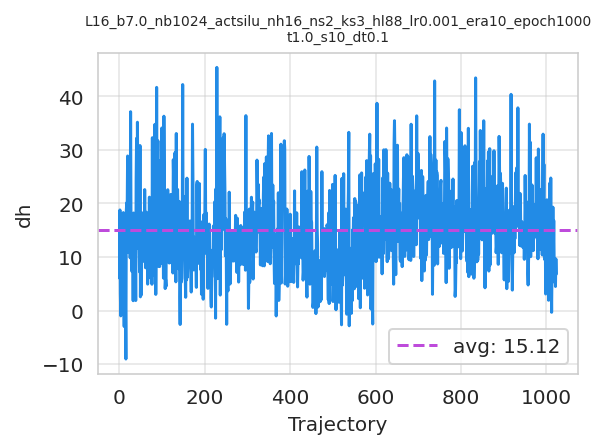

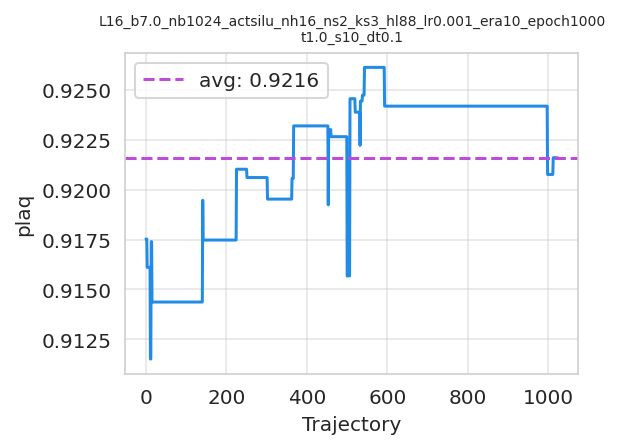

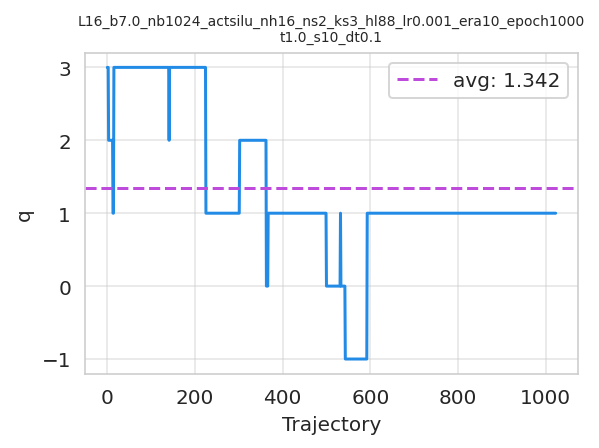

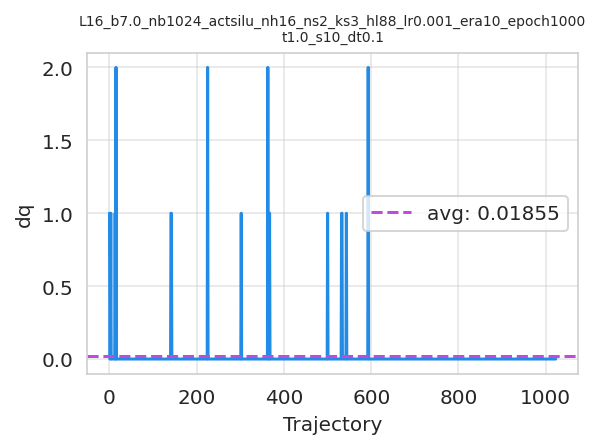

In [14]:
from fthmc.main import transfer

ftconfig = ftConfig(tau=1.0, nstep=10)
Lnew = 2 * train_config.L
layers = train_outputs['model'].layers
transfer_out = transfer(L=Lnew,
                        param=param,
                        layers=layers,
                        config=train_config,
                        ftconfig=ftconfig,
                        num_fthmc_trajs=1024)

───────────────────── Running `ftHMC` using trained flow for 1024 trajs ─────────────────────

[08:00:07 AM]  Running ftHMC with tau=0.1, nsteps=5

               plaq=0.711 q=-3.000

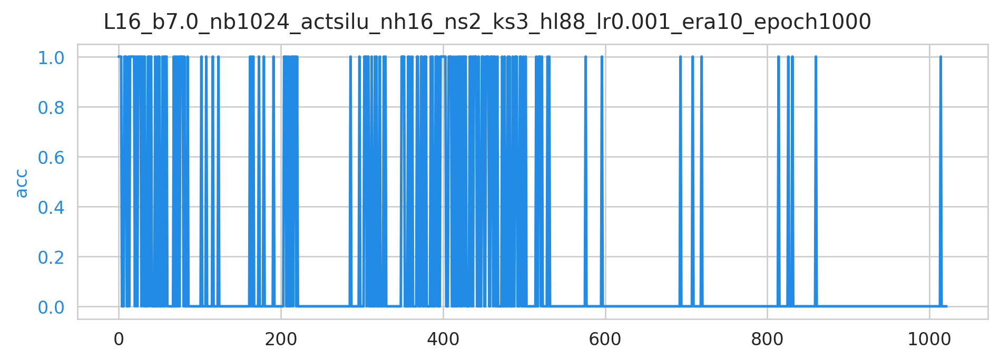

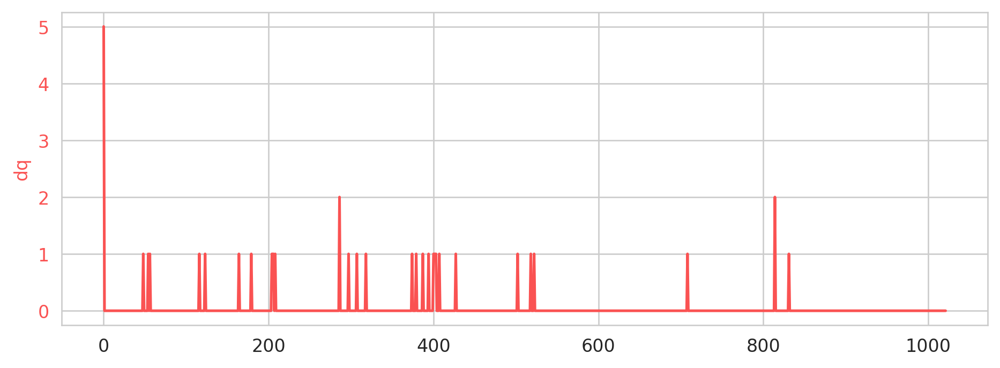

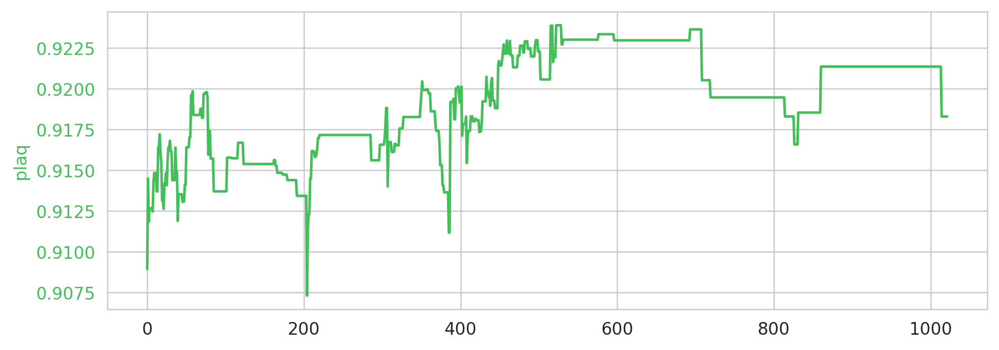

[08:00:08 AM]  traj=0 dt=0.424 acc=1.000 dh=-1.975 plaq=0.909 q=2.000 dq=5.000

[08:00:34 AM]  traj=50 dt=0.425 acc=1.000 dh=-1.687 plaq=0.916 q=1.000 dq=0.000

[08:01:00 AM]  traj=100 dt=0.426 acc=0.000 dh=8.418 plaq=0.914 q=1.000 dq=0.000

[08:01:26 AM]  traj=150 dt=0.428 acc=0.000 dh=9.662 plaq=0.915 q=1.000 dq=0.000

[08:01:54 AM]  traj=200 dt=0.428 acc=0.000 dh=1.812 plaq=0.913 q=1.000 dq=0.000

[08:02:20 AM]  traj=250 dt=0.428 acc=0.000 dh=6.031 plaq=0.917 q=1.000 dq=0.000

[08:02:46 AM]  traj=300 dt=0.430 acc=0.000 dh=3.842 plaq=0.917 q=0.000 dq=0.000

[08:03:13 AM]  traj=350 dt=0.428 acc=1.000 dh=-0.394 plaq=0.920 q=0.000 dq=0.000

[08:03:39 AM]  traj=400 dt=0.429 acc=1.000 dh=-0.102 plaq=0.919 q=-1.000 dq=1.000

[08:04:06 AM]  traj=450 dt=0.429 acc=1.000 dh=-2.002 plaq=0.921 q=-0.000 dq=0.000

[08:04:32 AM]  traj=500 dt=0.429 acc=0.000 dh=3.736 plaq=0.922 q=0.000 dq=0.000

[08:04:59 AM]  traj=550 dt=0.445 acc=0.000 dh=6.055 plaq=0.923 q=1.000 dq=0.000

[08:05:25 AM]  traj=600 dt=0.434 acc=0.000 dh=15.409 plaq=0.923 q=1.000 dq=0.000

[08:05:52 AM]  traj=650 dt=0.432 acc=0.000 dh=10.112 plaq=0.923 q=1.000 dq=0.000

[08:06:19 AM]  traj=700 dt=0.445 acc=0.000 dh=8.919 plaq=0.924 q=1.000 dq=0.000

[08:06:47 AM]  traj=750 dt=0.446 acc=0.000 dh=23.878 plaq=0.919 q=2.000 dq=0.000

[08:07:15 AM]  traj=800 dt=0.447 acc=0.000 dh=5.672 plaq=0.919 q=2.000 dq=0.000

[08:07:42 AM]  traj=850 dt=0.446 acc=0.000 dh=11.804 plaq=0.919 q=1.000 dq=0.000

[08:08:09 AM]  traj=900 dt=0.447 acc=0.000 dh=13.819 plaq=0.921 q=1.000 dq=0.000

[08:08:37 AM]  traj=950 dt=0.448 acc=0.000 dh=10.159 plaq=0.921 q=1.000 dq=0.000

[08:09:04 AM]  traj=1000 dt=0.447 acc=0.000 dh=6.503 plaq=0.921 q=1.000 dq=0.000

[08:09:17 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_16x16/beta7.0/L16_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s5_dt0.02/plo
               ts

[08:09:17 AM]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/ftHMC/t0.1_s5_dt0.02/plots

[08:09:18 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t0.1_s5_dt0.02/plots/traj.png

[08:09:19 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t0.1_s5_dt0.02/plots/dt.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t0.1_s5_dt0.02/plots/acc.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t0.1_s5_dt0.02/plots/dh.png

[08:09:20 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t0.1_s5_dt0.02/plots/plaq.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t0.1_s5_dt0.02/plots/q.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/ftHMC/t0.1_s5_dt0.02/plots/dq.png

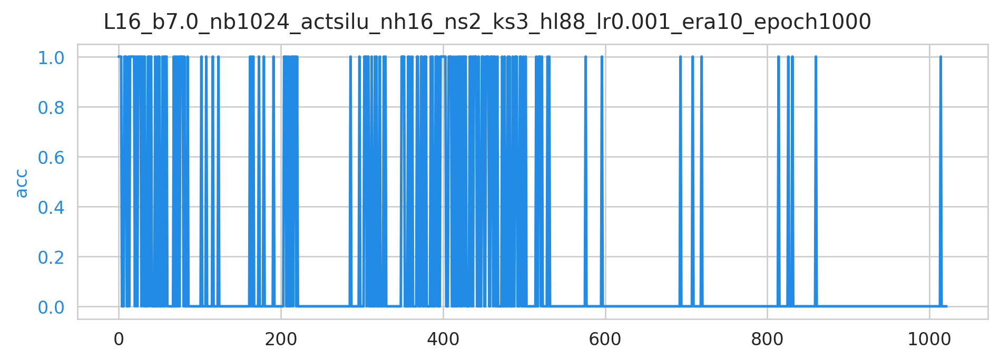

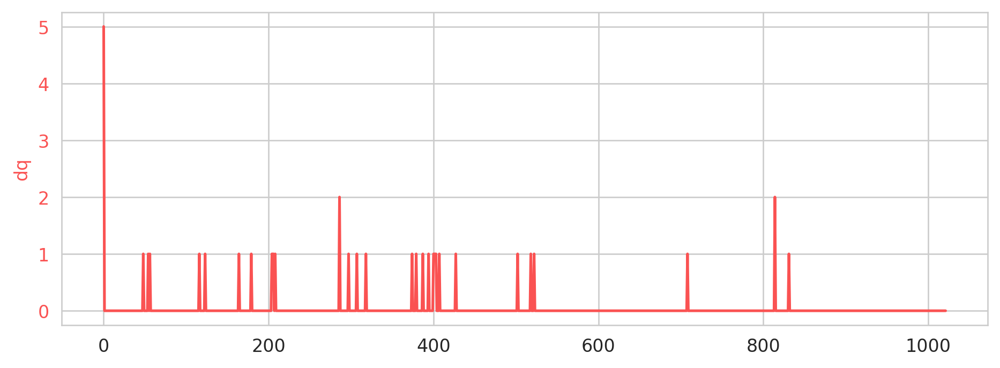

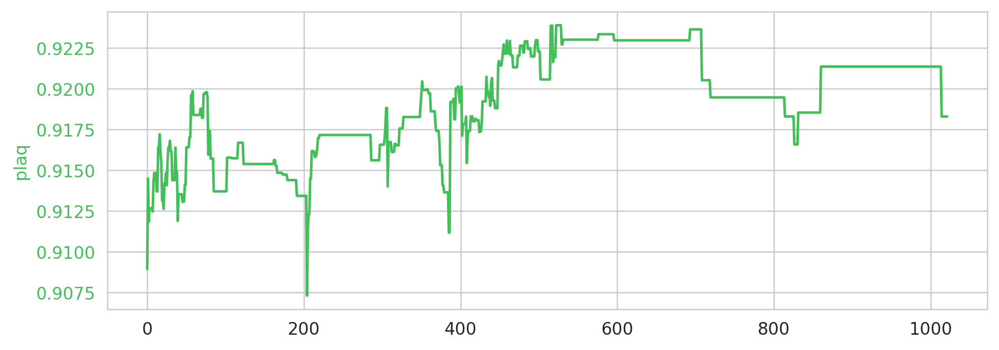

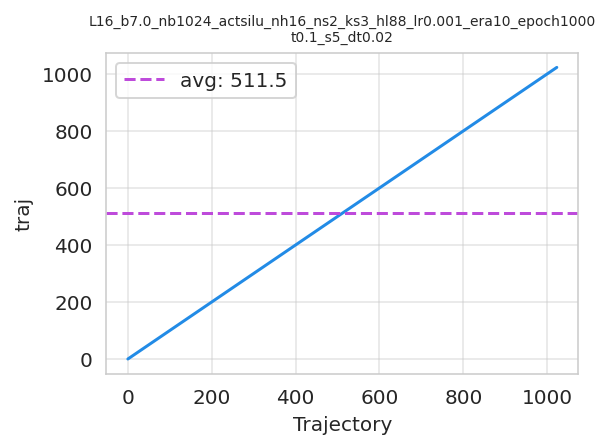

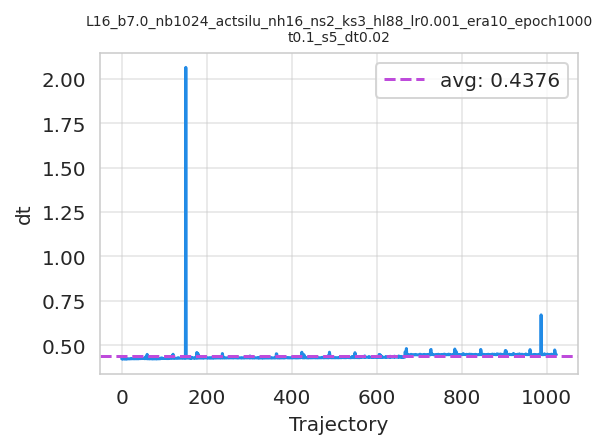

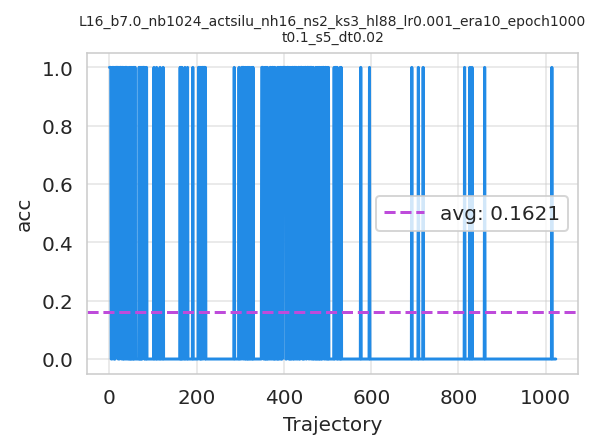

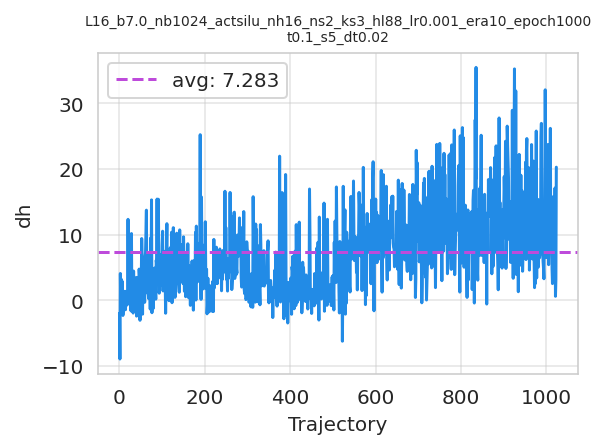

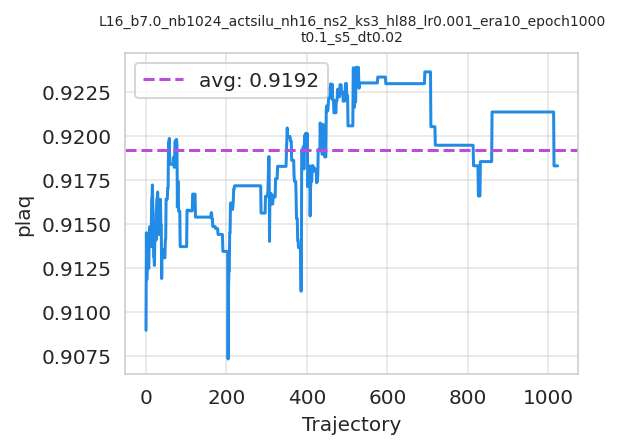

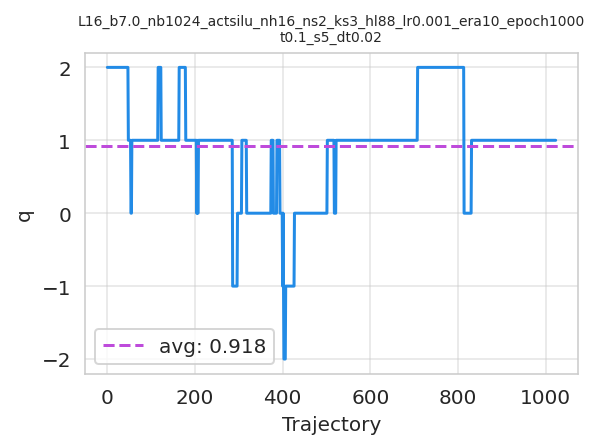

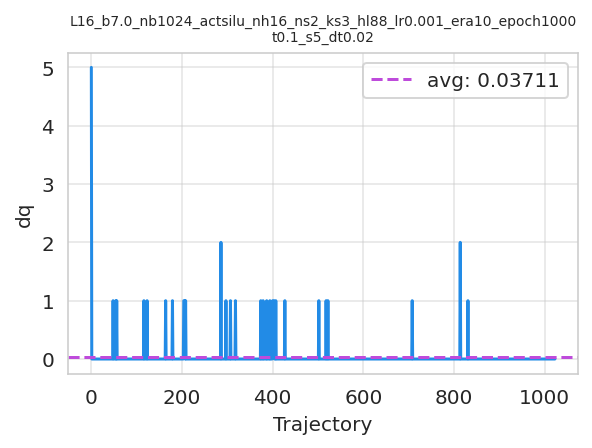

In [18]:
config16 = transfer_out['config']
model16 = transfer_out['model']
flow16 = model16.layers
ftconfig16 = ftConfig(tau=0.1, nstep=5)
fthmc_outputs16 = run_fthmc(flow=flow16,
                            num_trajs=1024,
                            config=config16,
                            ftconfig=ftconfig16)

──────────────────────── Transferring trained model to 32x32 lattice ────────────────────────

───────────────────── Running HMC for 1 runs, each of 1000 trajectories ─────────────────────

[08:13:49 AM]  Creating directory:                                                           
               ../../logs/hmc/lat32x32/beta7.0/t32x32_b7.0_n1000_t0.5_s5/plots

[08:13:49 AM]  Param:                                                                        
               ----------------                                                              
               beta=7.0                                                                      
               L=32                                                                          
               tau=0.5                                                                       
               nstep=5                                                                       
               ntraj=1000                                                                    
               nrun=1                                                                        
               nprint=100                                                                    
               seed=1331                                                                     
               randinit=False                                                                
               nth_interop=2                                                                 
               nth=2                                                                         
               lat=[32, 32]                                                                  
               nd=2                                                                          
               shape=[2, 32, 32]                                                             
               volume=1024                                                                   
               dt=0.1                                                                        
               logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/beta7.0/t32x32
               _b7.0_n1000_t0.5_s5

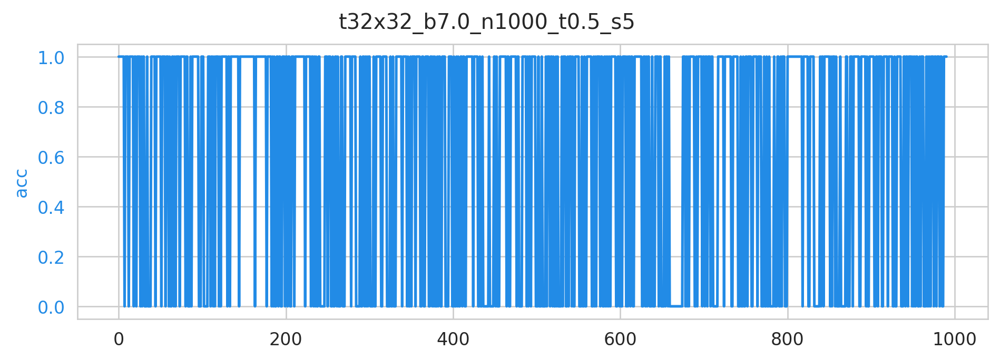

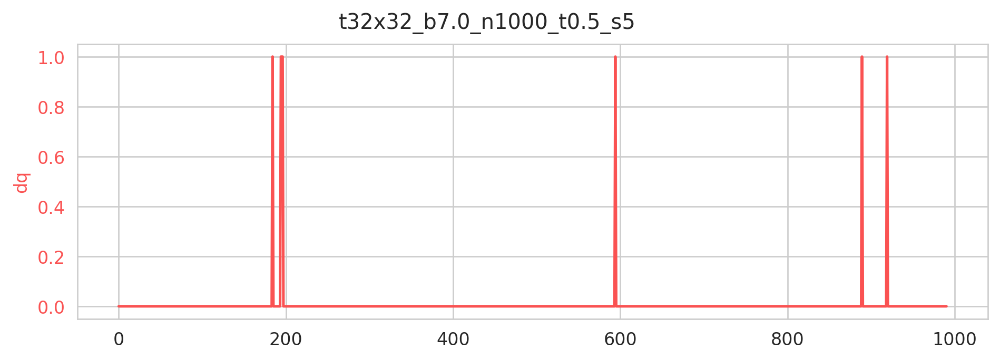

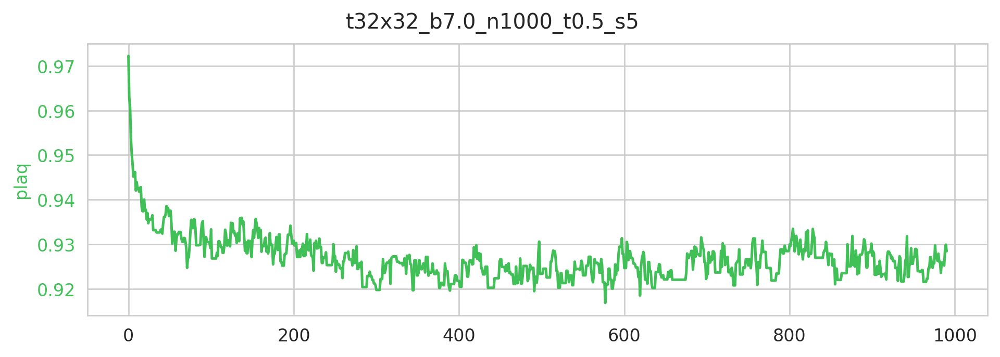

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

[08:13:51 AM]  plaq=1.000 q=0.000

               traj=2 dt=0.004 acc=1.000 dH=-4.568 plaq=0.963 q=0 dq=0.000

[08:13:58 AM]  traj=102 dt=0.004 acc=1.000 dH=-2.783 plaq=0.927 q=0 dq=0.000

[08:14:04 AM]  traj=202 dt=0.004 acc=1.000 dH=-0.108 plaq=0.930 q=1 dq=0.000

[08:14:11 AM]  traj=302 dt=0.004 acc=0.000 dH=1.275 plaq=0.920 q=1 dq=0.000

[08:14:18 AM]  traj=402 dt=0.004 acc=1.000 dH=0.604 plaq=0.920 q=1 dq=0.000

[08:14:25 AM]  traj=502 dt=0.004 acc=0.000 dH=1.971 plaq=0.923 q=1 dq=0.000

[08:14:31 AM]  traj=602 dt=0.004 acc=0.000 dH=0.088 plaq=0.925 q=1 dq=0.000

[08:14:39 AM]  traj=702 dt=0.004 acc=0.000 dH=1.103 plaq=0.923 q=1 dq=0.000

[08:14:46 AM]  traj=802 dt=0.004 acc=1.000 dH=0.435 plaq=0.930 q=1 dq=0.000

[08:14:53 AM]  traj=902 dt=0.004 acc=1.000 dH=-0.104 plaq=0.928 q=1 dq=0.000

[08:14:59 AM]  Creating directory:                                                           
               ../../logs/hmc/lat32x32/beta7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0

[08:14:59 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/traj.png

[08:15:00 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/dt.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/acc.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/dH.png

[08:15:01 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/plaq.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/q.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/dq.png

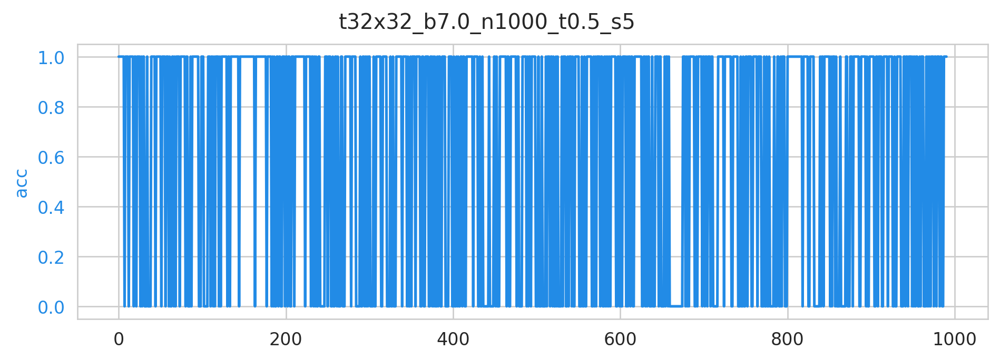

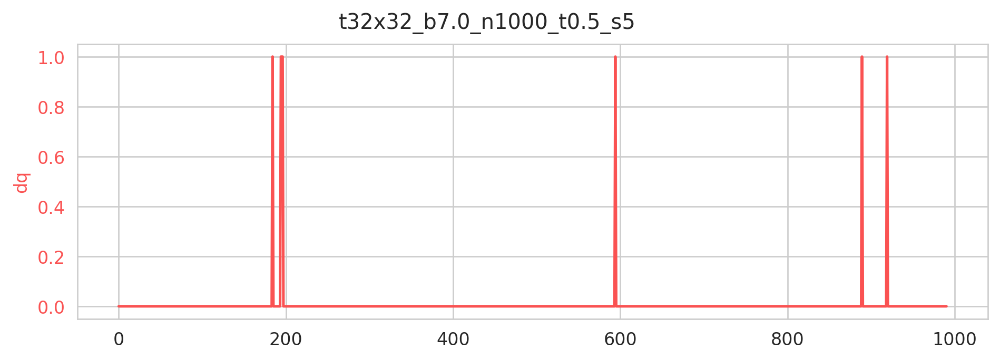

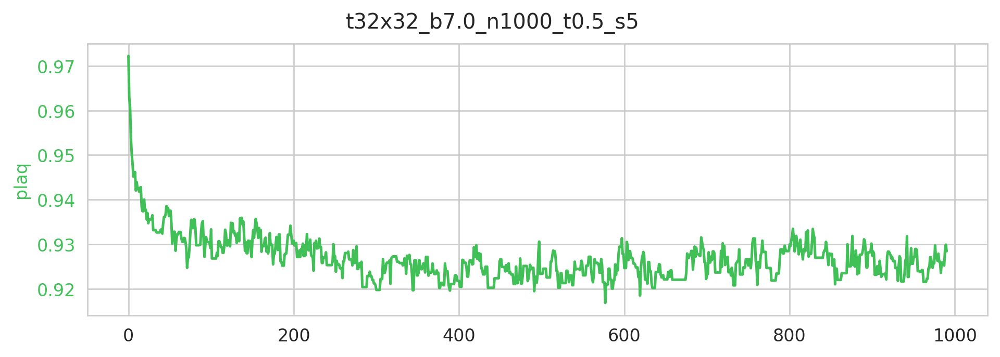

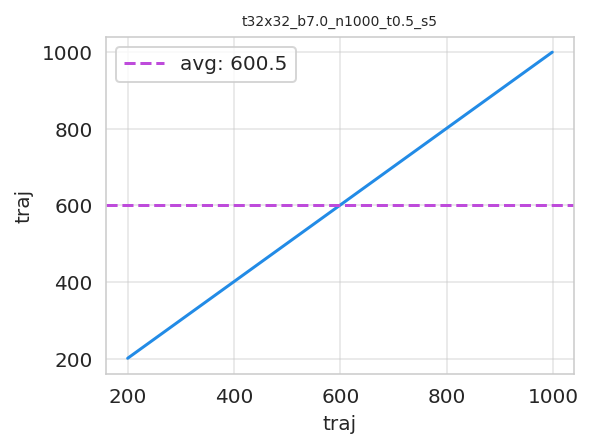

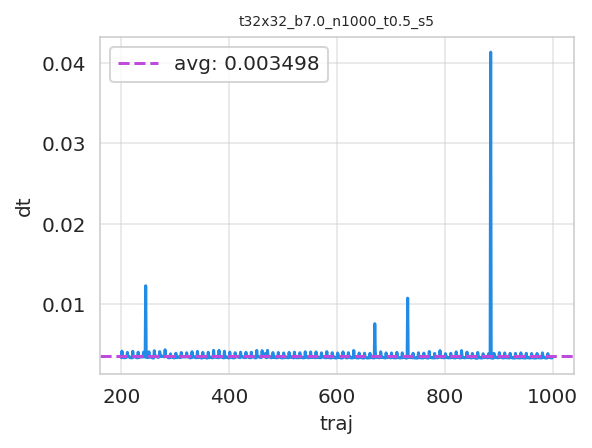

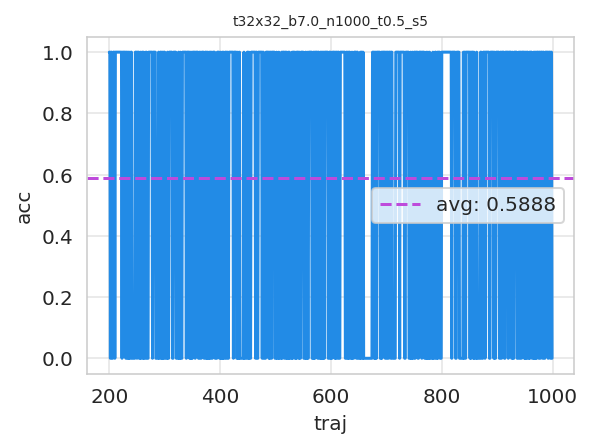

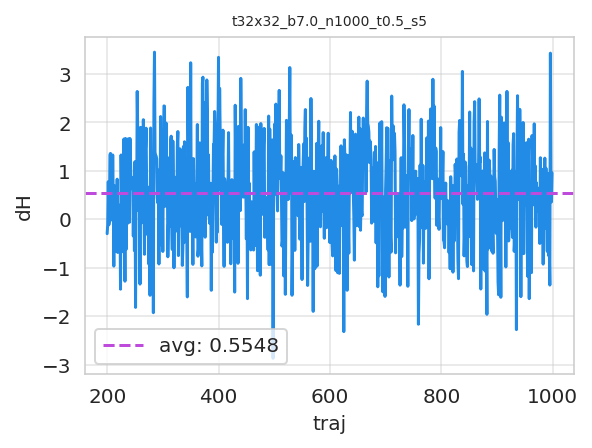

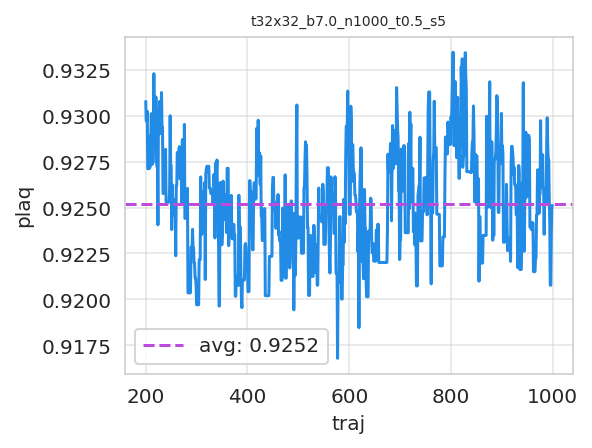

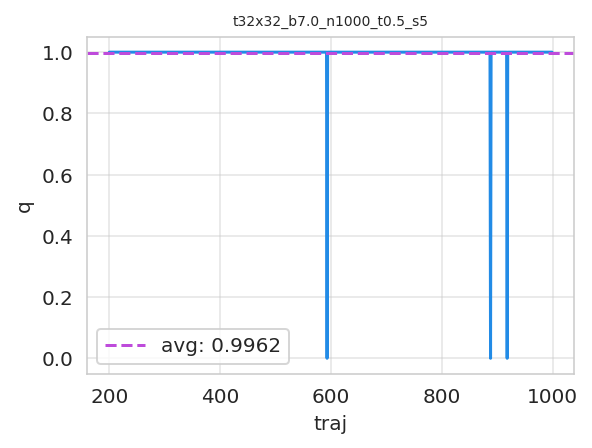

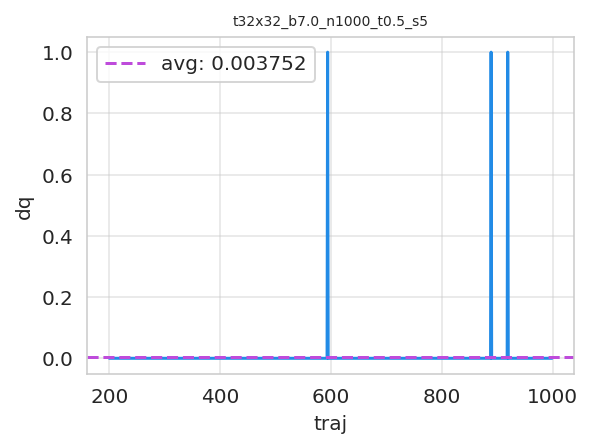

[08:15:03 AM]  Run times: ['68.7831']

               Per trajectory: ['0.0688']

[08:15:03 AM]  Saving hmc_histories to                                                       
               ../../logs/hmc/lat32x32/beta7.0/t32x32_b7.0_n1000_t0.5_s5/hmc_histories.z.

[08:15:03 AM]  Saving hmc_fields_arr to                                                      
               ../../logs/hmc/lat32x32/beta7.0/t32x32_b7.0_n1000_t0.5_s5/hmc_fields_arr.z.

──────────────────── Training FlowModel for 10 era, each of 1000 epochs ─────────────────────

[08:15:04 AM]  TrainConfig:                                                                  
               ------------                                                                  
               L=32                                                                          
               beta=7.0                                                                      
               restore=False                                                                 
               activation_fn=silu                                                            
               n_era=10                                                                      
               n_epoch=1000                                                                  
               batch_size=1024                                                               
               base_lr=0.001                                                                 
               n_s_nets=2                                                                    
               n_layers=16                                                                   
               kernel_size=3                                                                 
               with_force=False                                                              
               print_freq=500                                                                
               plot_freq=100                                                                 
               log_freq=100                                                                  
               hidden_sizes=[8, 8]                                                           
               lat=[32, 32]                                                                  
               nd=2                                                                          
               shape=[2, 32, 32]                                                             
               volume=1024                                                                   
               logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7
               .0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/
               beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000     
               dirs:                                                                         
               -----                                                                         
               logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7
               .0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/
               beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000     
               training=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_
               b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x3
               2/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tr
               aining                                                                        
               inference=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8
               _b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x
               32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/i
               nference                                                                      
               ckpts=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7.
               0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/b
               eta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/train
               ing/checkpoints

[08:15:04 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0815
               04

[08:15:04 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0815
               04/plots

[08:15:04 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0815
               04/checkpoints

[08:15:04 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0815
               04/summaries

[08:15:04 AM]  Writing summaries to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/summaries

               Scheduler created!

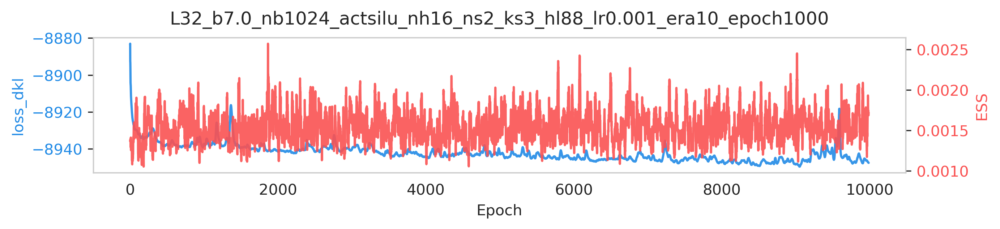

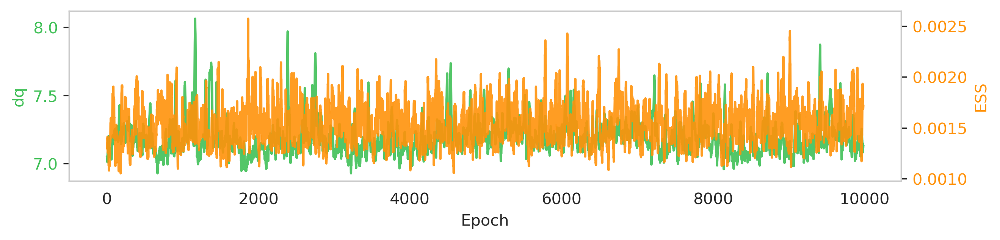

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[08:16:54 AM]  epoch=500 dt=0.201 ess=0.001 logp=6571.128 logq=-2365.863 loss_dkl=-8936.991  
               dq=7.249 plaq=0.917

[08:18:43 AM]  epoch=1000 dt=0.201 ess=0.004 logp=6578.432 logq=-2358.962 loss_dkl=-8937.395 
               dq=7.150 plaq=0.918

[08:18:44 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 3 min 39.42 sec ─────────────────────────────

[08:20:33 AM]  epoch=1500 dt=0.200 ess=0.001 logp=6575.519 logq=-2364.321 loss_dkl=-8939.840 
               dq=7.065 plaq=0.917

[08:22:23 AM]  epoch=2000 dt=0.200 ess=0.003 logp=6573.559 logq=-2367.348 loss_dkl=-8940.906 
               dq=7.362 plaq=0.917

[08:22:23 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 3 min 39.32 sec ─────────────────────────────

[08:24:15 AM]  epoch=2500 dt=0.201 ess=0.001 logp=6581.884 logq=-2360.120 loss_dkl=-8942.004 
               dq=6.873 plaq=0.918

[08:26:05 AM]  epoch=3000 dt=0.201 ess=0.001 logp=6573.143 logq=-2367.637 loss_dkl=-8940.780 
               dq=6.906 plaq=0.917

[08:26:05 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 3 min 40.18 sec ─────────────────────────────

[08:27:55 AM]  epoch=3500 dt=0.201 ess=0.003 logp=6575.766 logq=-2366.537 loss_dkl=-8942.303 
               dq=7.081 plaq=0.917

[08:29:46 AM]  epoch=4000 dt=0.201 ess=0.001 logp=6574.759 logq=-2369.250 loss_dkl=-8944.010 
               dq=6.934 plaq=0.917

[08:29:47 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 3 min 40.7 sec ──────────────────────────────

[08:31:37 AM]  epoch=4500 dt=0.201 ess=0.001 logp=6569.304 logq=-2371.267 loss_dkl=-8940.571 
               dq=7.558 plaq=0.916

[08:33:27 AM]  epoch=5000 dt=0.201 ess=0.001 logp=6577.404 logq=-2363.420 loss_dkl=-8940.824 
               dq=6.926 plaq=0.918

[08:33:28 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 3 min 40.38 sec ─────────────────────────────

[08:35:19 AM]  epoch=5500 dt=0.201 ess=0.001 logp=6569.011 logq=-2372.507 loss_dkl=-8941.518 
               dq=7.366 plaq=0.916

[08:37:09 AM]  epoch=6000 dt=0.201 ess=0.001 logp=6577.097 logq=-2368.758 loss_dkl=-8945.855 
               dq=6.874 plaq=0.918

[08:37:10 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 3 min 40.76 sec ─────────────────────────────

[08:39:01 AM]  epoch=6500 dt=0.200 ess=0.002 logp=6582.521 logq=-2363.253 loss_dkl=-8945.775 
               dq=7.257 plaq=0.918

[08:40:51 AM]  epoch=7000 dt=0.201 ess=0.002 logp=6573.562 logq=-2371.126 loss_dkl=-8944.688 
               dq=6.891 plaq=0.917

[08:40:52 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 3 min 41.29 sec ─────────────────────────────

[08:42:44 AM]  epoch=7500 dt=0.201 ess=0.001 logp=6574.591 logq=-2371.089 loss_dkl=-8945.681 
               dq=7.500 plaq=0.917

[08:44:34 AM]  epoch=8000 dt=0.201 ess=0.001 logp=6581.997 logq=-2365.916 loss_dkl=-8947.913 
               dq=7.173 plaq=0.918

[08:44:35 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 3 min 41.35 sec ─────────────────────────────

[08:46:27 AM]  epoch=8500 dt=0.201 ess=0.001 logp=6581.771 logq=-2367.524 loss_dkl=-8949.295 
               dq=6.707 plaq=0.918

[08:48:21 AM]  epoch=9000 dt=0.201 ess=0.002 logp=6576.184 logq=-2371.662 loss_dkl=-8947.847 
               dq=7.326 plaq=0.917

[08:48:21 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 3 min 44.34 sec ─────────────────────────────

[08:50:13 AM]  epoch=9500 dt=0.201 ess=0.001 logp=6572.677 logq=-2366.299 loss_dkl=-8938.977 
               dq=7.347 plaq=0.917

[08:52:04 AM]  epoch=10000 dt=0.201 ess=0.003 logp=6588.085 logq=-2359.942 loss_dkl=-8948.027
               dq=6.985 plaq=0.919

[08:52:04 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era9-epoch999.tar

[08:52:07 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era10-epoch1001.tar

[08:52:09 AM]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/plots

[08:52:10 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/dt.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/ess.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/logp.png

[08:52:11 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/logq.png

[08:52:12 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/loss_dkl.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/q.png

[08:52:13 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/dq.png

[08:52:14 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/plaq.png

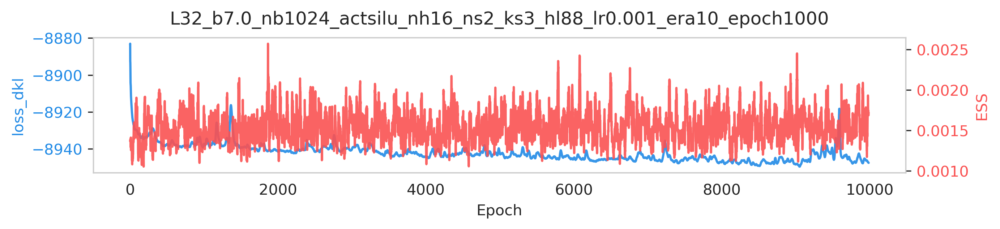

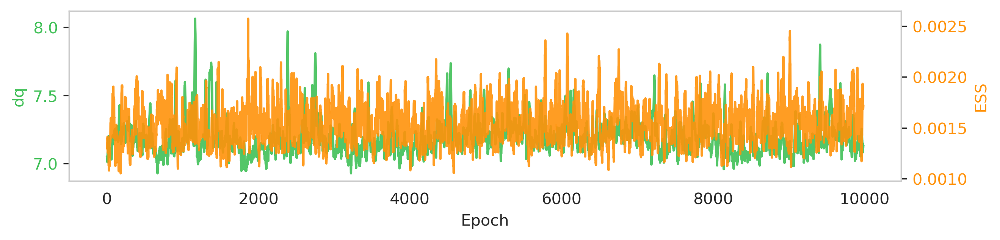

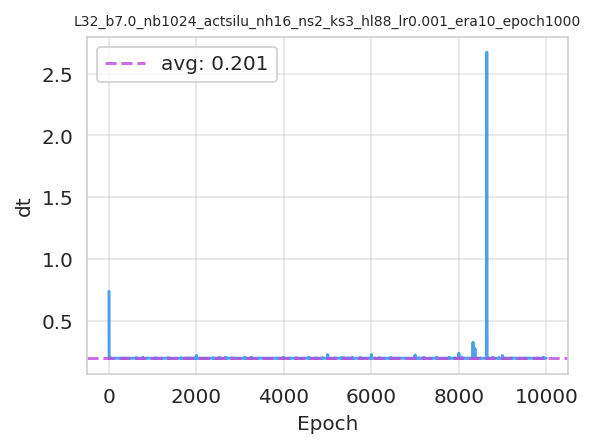

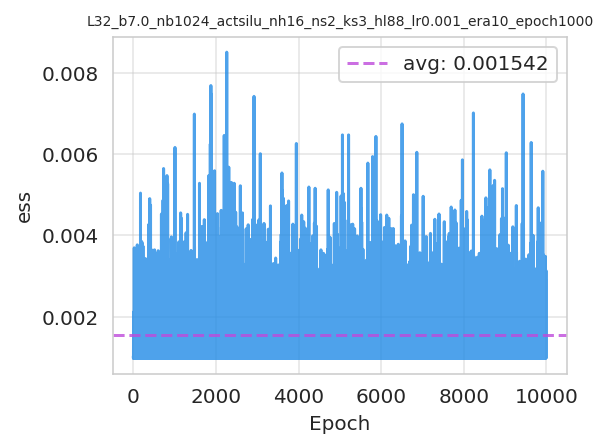

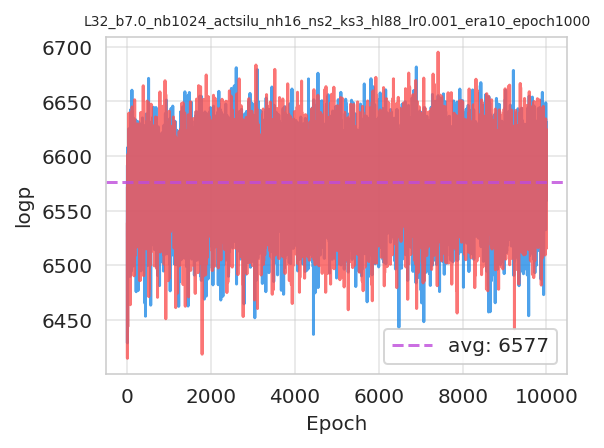

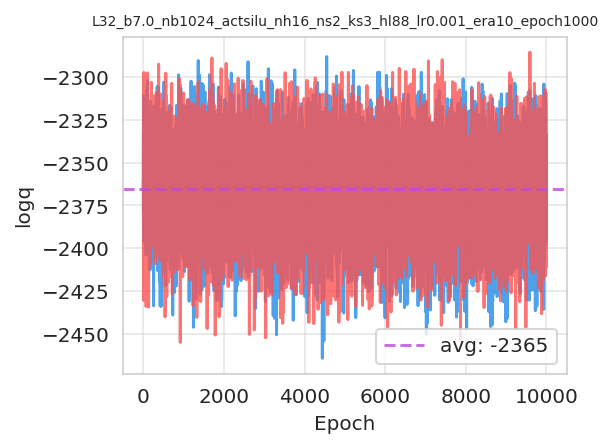

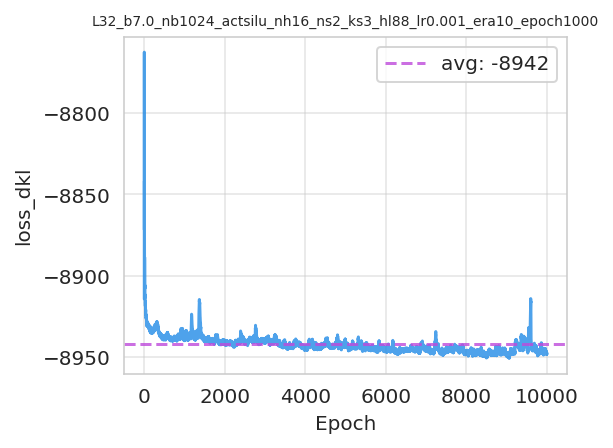

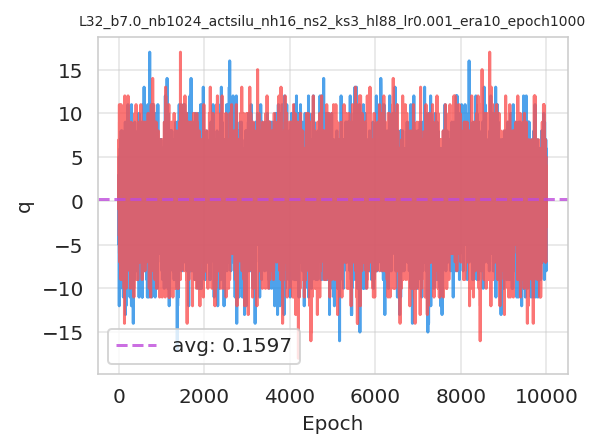

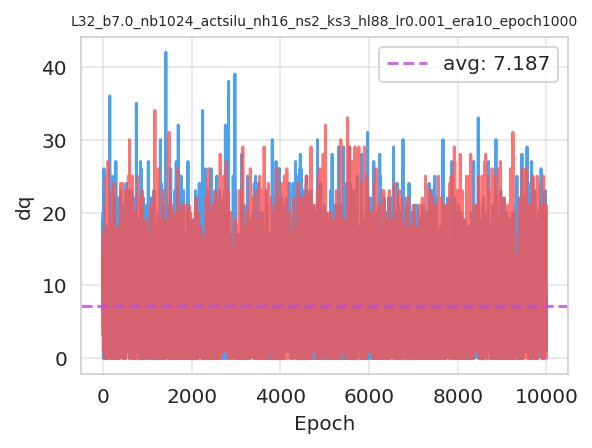

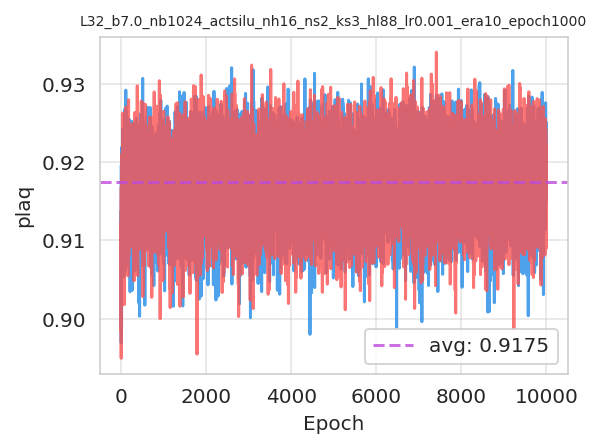

[08:52:17 AM]  Saving train_history to ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsil
               u_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0
               _nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-
               081504/train_history.z.

─────────────────────── Using trained model to generate 8192 samples ────────────────────────

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/utils/inference.py:116: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[08:52:32 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/inference/plots

[08:52:32 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/inference/plots/logq.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/inference/plots/logp.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/inference/plots/accepted.png

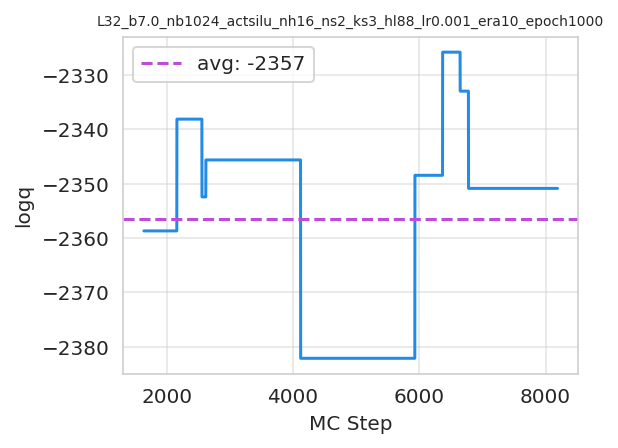

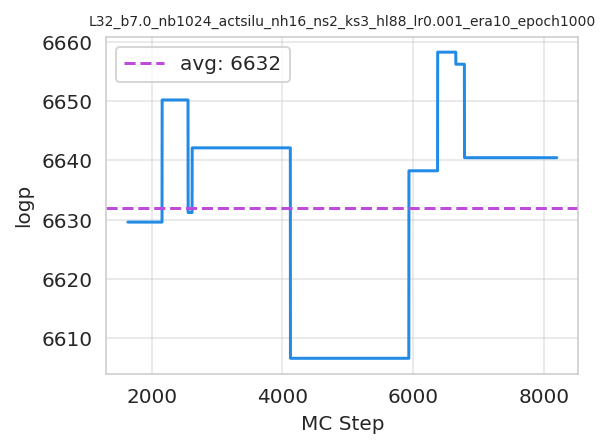

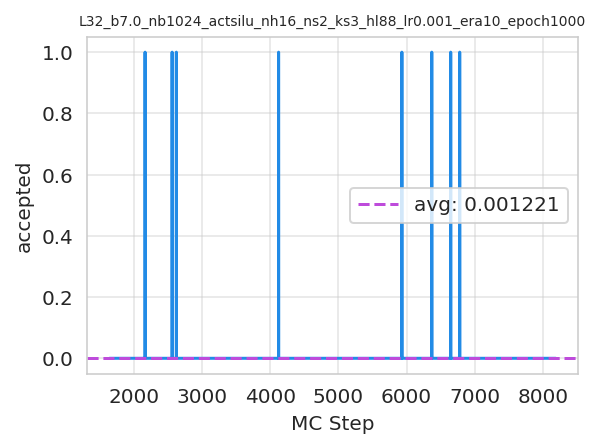

───────────────────── Running `ftHMC` using trained flow for 1024 trajs ─────────────────────

[08:52:33 AM]  Running ftHMC with tau=0.5, nsteps=10

               plaq=0.722 q=-7.000

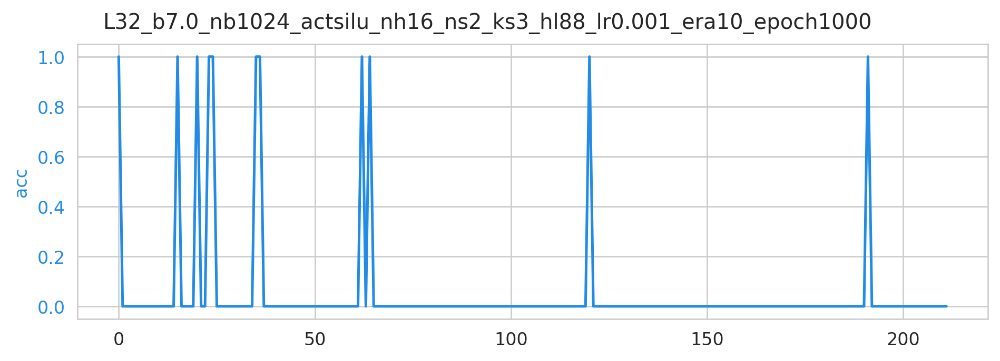

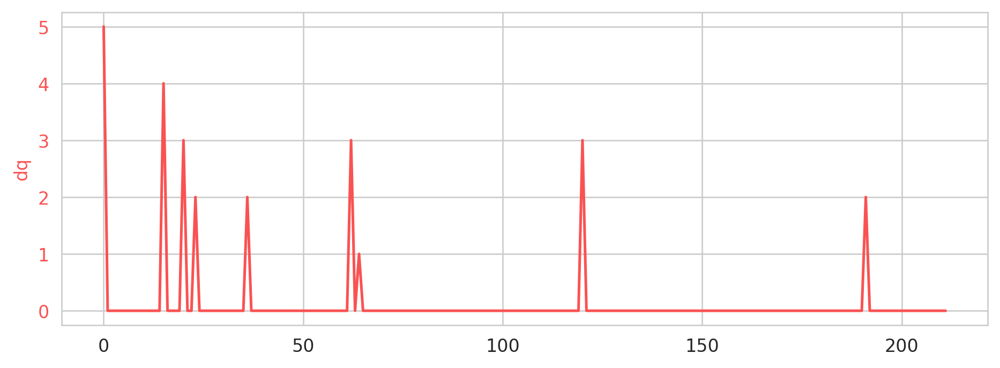

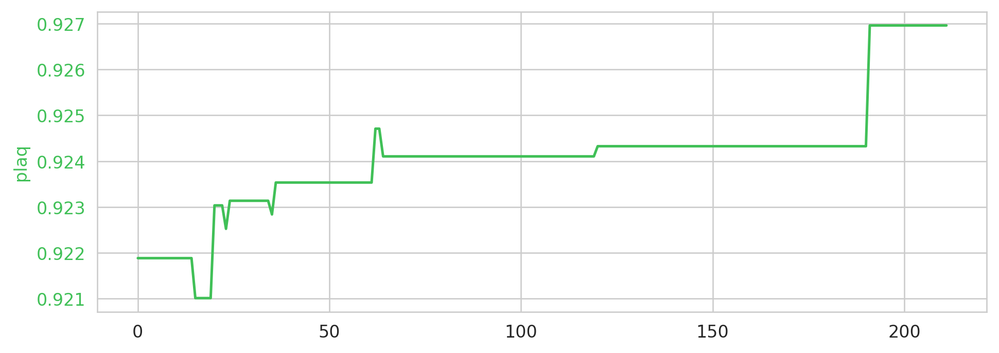

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/field_transformation.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[08:52:35 AM]  traj=0 dt=1.086 acc=1.000 dh=-20.972 plaq=0.922 q=-2.000 dq=5.000

[08:53:22 AM]  traj=50 dt=0.842 acc=0.000 dh=24.114 plaq=0.924 q=-3.000 dq=0.000

[08:54:09 AM]  traj=100 dt=0.842 acc=0.000 dh=3.565 plaq=0.924 q=1.000 dq=0.000

[08:54:56 AM]  traj=150 dt=0.843 acc=0.000 dh=45.793 plaq=0.924 q=-2.000 dq=0.000

[08:55:43 AM]  traj=200 dt=0.846 acc=0.000 dh=14.422 plaq=0.927 q=0.000 dq=0.000

In [ ]:
from fthmc.main import transfer

ftconfig = ftConfig(tau=0.5, nstep=10)
Lnew = 4 * train_config.L
layers = train_outputs['model'].layers
transfer_out = transfer(L=Lnew,
                        param=param,
                        layers=layers,
                        config=train_config,
                        ftconfig=ftconfig,
                        num_fthmc_trajs=1024)

In [ ]:
from fthmc.main import transfer

ftconfig = ftConfig(tau=1.0, nstep=10)
Lnew = 8 * train_config.L
layers = train_outputs['model'].layers
transfer_out = transfer(L=Lnew,
                        param=param,
                        layers=layers,
                        config=train_config,
                        ftconfig=ftconfig,
                        num_fthmc_trajs=1024)

In [ ]:
from fthmc.main import transfer

ftconfig = ftConfig(tau=1.0, nstep=10)
Lnew = 16 * train_config.L
layers = train_outputs['model'].layers
transfer_out = transfer(L=Lnew,
                        param=param,
                        layers=layers,
                        config=train_config,
                        ftconfig=ftconfig,
                        num_fthmc_trajs=1024)

In [32]:
from dataclasses import asdict
from fthmc.train import train, transfer_to_new_lattice

from torch import nn 

def transfer(
        L: int,
        param: Param,
        config: TrainConfig,
        scheduler_config: SchedulerConfig,
        layers: nn.ModuleList,
        new_lr: float = None,
        run_hmc: bool = True,
        figsize: tuple = None,
):
    if figsize is None:
        figsize = (9, 2)
        
    xfr = transfer_to_new_lattice(L=L,
                                  layers=layers,
                                  config=config)
    config_new = xfr['config']
    model_new = xfr['model']
    # ----------------------------------------------
    # Run HMC using new (transferred) `param` above
    # ----------------------------------------------
    #if run_hmc:
    #    from fthmc.hmc import run_hmc
    #    hmc_fields, hmc_history = run_hmc(param)


    if new_lr is not None:
        cfg_dict = asdict(config)
        cfg_dict['base_lr'] = new_lr
        config_new = TrainConfig(**cfg_dict)

    train_outputs = train(config_new,
                          model=model_new,
                          pre_model=None,
                          figsize=figsize,
                          scheduler_config=scheduler_config)
    return {
        #'param': param_new,
        'config': config_new,
        'model': model_new,
        'outputs': train_outputs
    }

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

[20:45:58]  Creating directory: ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh16_n
            s2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-11-204558

[20:45:58]  Creating directory: ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh16_n
            s2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-11-204558/plots

[20:45:58]  Creating directory: ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh16_n
            s2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-11-204558/checkpoints

[20:45:58]  Creating directory: ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh16_n
            s2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-11-204558/summaries

[20:45:59]  Writing summaries to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/summaries

            Scheduler created!

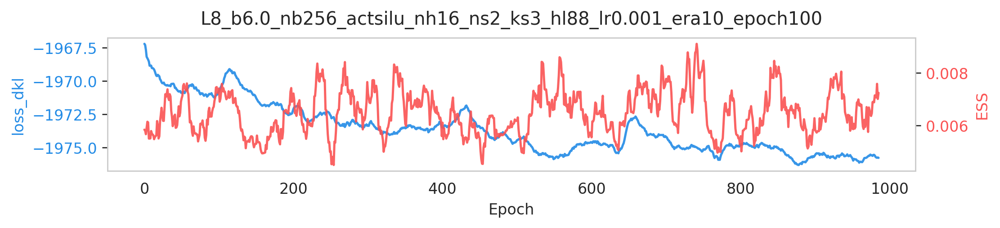

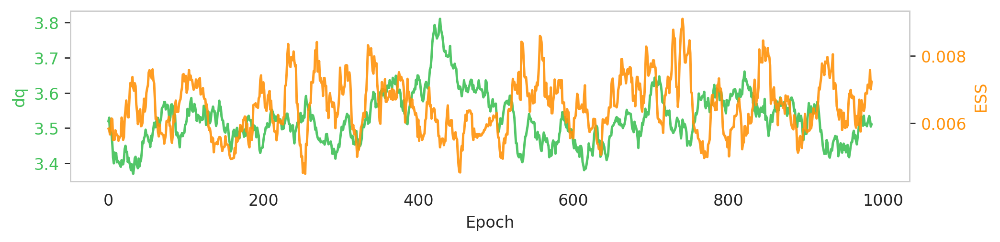

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[20:46:10]  epoch=100 dt=0.088 ess=0.004 logp=1351.456 logq=-619.231 loss_dkl=-1970.687      
            dq=3.430 plaq=3.519

[20:46:10]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era0-epoch99.tar

───────────────────────────── ERA=1, last took: 0 min 11.11 sec ─────────────────────────────

[20:46:19]  epoch=200 dt=0.088 ess=0.004 logp=1352.772 logq=-621.682 loss_dkl=-1974.455      
            dq=3.234 plaq=3.523

[20:46:20]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era1-epoch99.tar

───────────────────────────── ERA=2, last took: 0 min 9.645 sec ─────────────────────────────

[20:46:29]  epoch=300 dt=0.088 ess=0.013 logp=1351.876 logq=-621.552 loss_dkl=-1973.428      
            dq=3.465 plaq=3.521

[20:46:29]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era2-epoch99.tar

───────────────────────────── ERA=3, last took: 0 min 9.586 sec ─────────────────────────────

[20:46:39]  epoch=400 dt=0.089 ess=0.006 logp=1348.187 logq=-624.782 loss_dkl=-1972.969      
            dq=3.559 plaq=3.511

[20:46:39]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era3-epoch99.tar

───────────────────────────── ERA=4, last took: 0 min 9.725 sec ─────────────────────────────

[20:46:48]  epoch=500 dt=0.089 ess=0.005 logp=1354.221 logq=-621.353 loss_dkl=-1975.574      
            dq=3.543 plaq=3.527

[20:46:49]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era4-epoch99.tar

───────────────────────────── ERA=5, last took: 0 min 9.661 sec ─────────────────────────────

[20:46:58]  epoch=600 dt=0.092 ess=0.008 logp=1354.979 logq=-619.558 loss_dkl=-1974.537      
            dq=3.652 plaq=3.529

[20:46:59]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era5-epoch99.tar

───────────────────────────── ERA=6, last took: 0 min 9.675 sec ─────────────────────────────

[20:47:08]  epoch=700 dt=0.089 ess=0.005 logp=1351.781 logq=-622.783 loss_dkl=-1974.564      
            dq=3.918 plaq=3.520

[20:47:09]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era6-epoch99.tar

───────────────────────────── ERA=7, last took: 0 min 9.735 sec ─────────────────────────────

[20:47:18]  epoch=800 dt=0.090 ess=0.004 logp=1352.390 logq=-621.180 loss_dkl=-1973.570      
            dq=3.578 plaq=3.522

[20:47:18]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era7-epoch99.tar

───────────────────────────── ERA=8, last took: 0 min 9.701 sec ─────────────────────────────

[20:47:27]  epoch=900 dt=0.090 ess=0.011 logp=1353.170 logq=-622.655 loss_dkl=-1975.825      
            dq=3.270 plaq=3.524

[20:47:28]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era8-epoch99.tar

───────────────────────────── ERA=9, last took: 0 min 9.621 sec ─────────────────────────────

[20:47:37]  epoch=1000 dt=0.089 ess=0.008 logp=1358.712 logq=-617.487 loss_dkl=-1976.198     
            dq=3.461 plaq=3.538

[20:47:38]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era9-epoch99.tar

            Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era10-epoch101.tar

[20:47:38]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/plots

[20:47:39]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/dt.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/ess.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/logp.png

[20:47:40]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/logq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/loss_dkl.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/q.png

[20:47:41]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/dq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/plaq.png

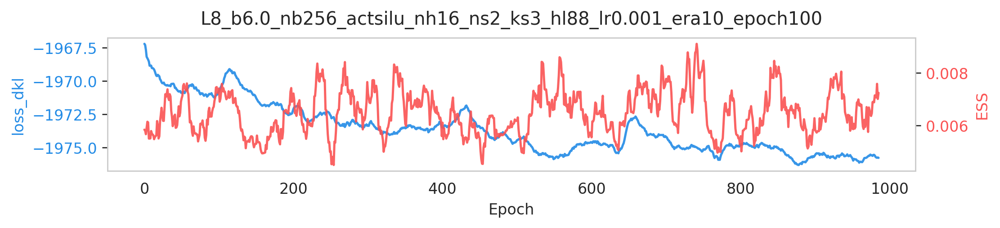

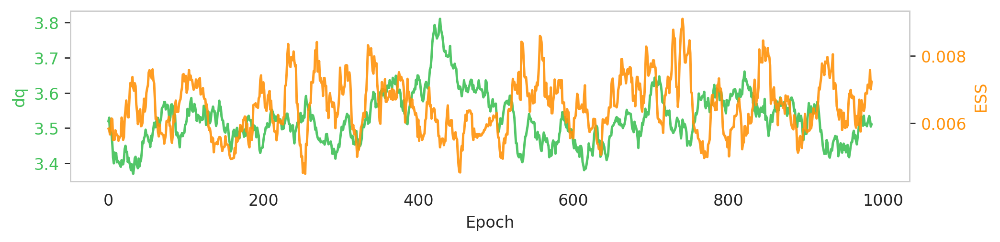

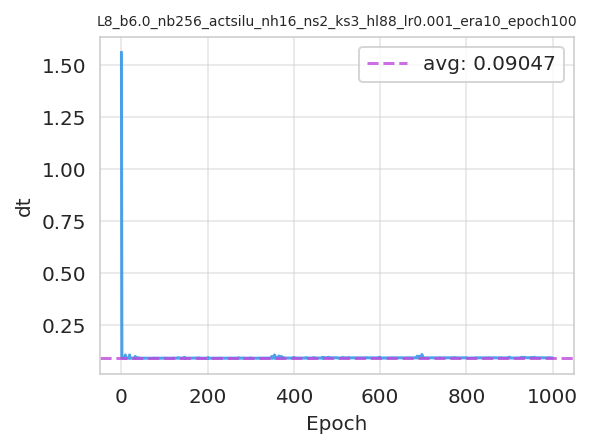

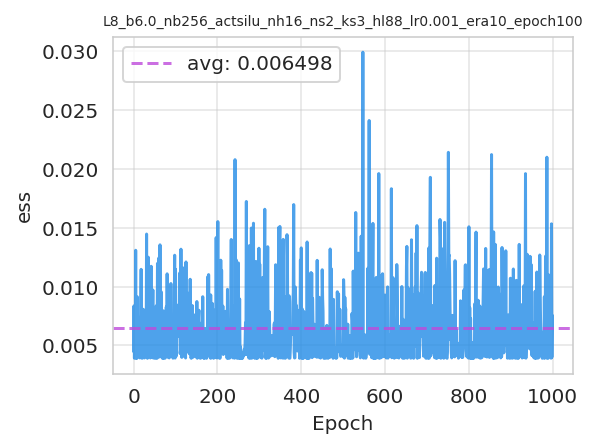

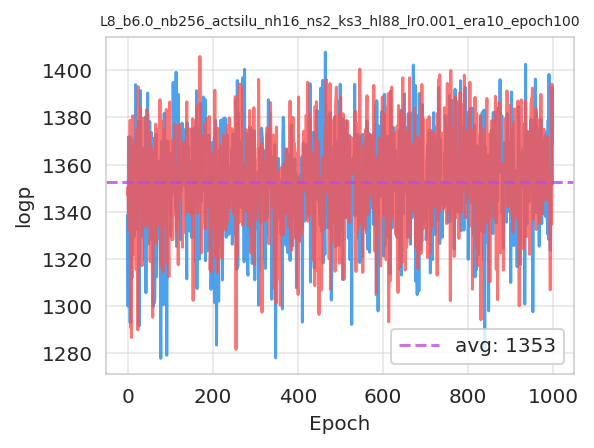

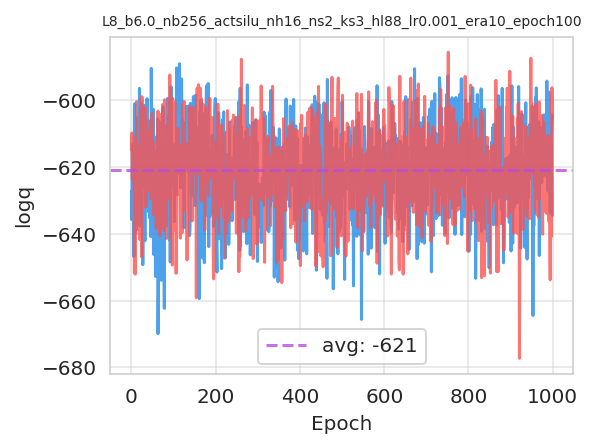

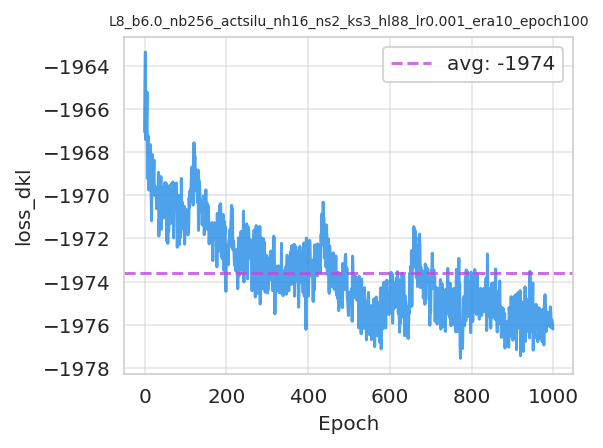

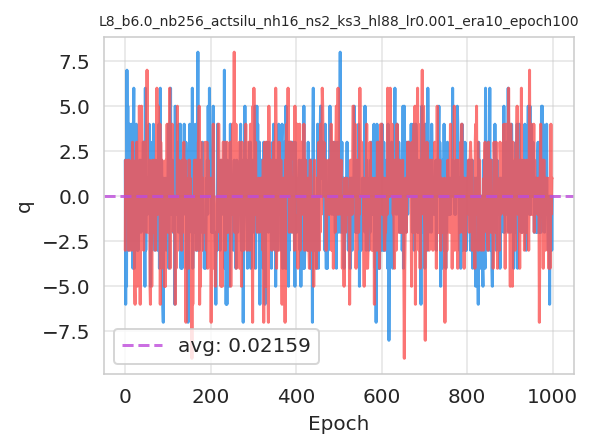

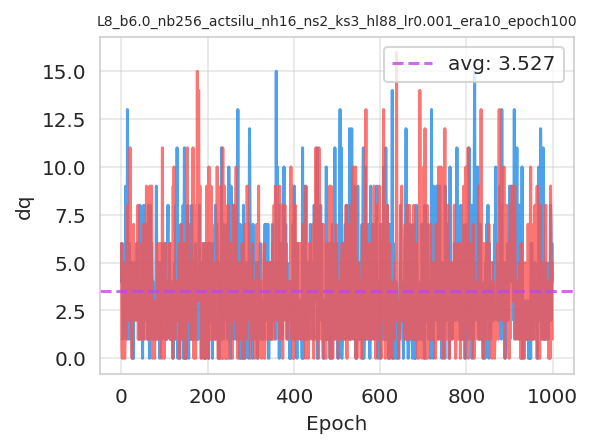

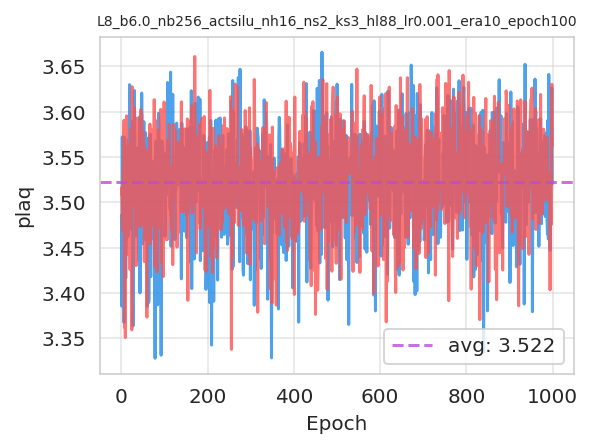

[20:47:43]  Saving train_history to ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh
            16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-11-204558/train_history.z
            .

In [33]:
layers8 = train_outputs['model'].layers #['layers']
layers8.train()
train_outputs16 = transfer(L=16, param=param,
                           config=train_config,
                           layers=layers8, 
                           scheduler_config=scheduler_config,
                           new_lr=0.001, run_hmc=False)

## Run inference on trained model

──────────────────── Running inference on trained model for 8192 samples ────────────────────

[20:51:37]  Creating directory: ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh16_n
            s2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/inference/plots

[20:51:37]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x
            16/inference/plots/x.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x
            16/inference/plots/logq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x
            16/inference/plots/logp.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x
            16/inference/plots/accepted.png

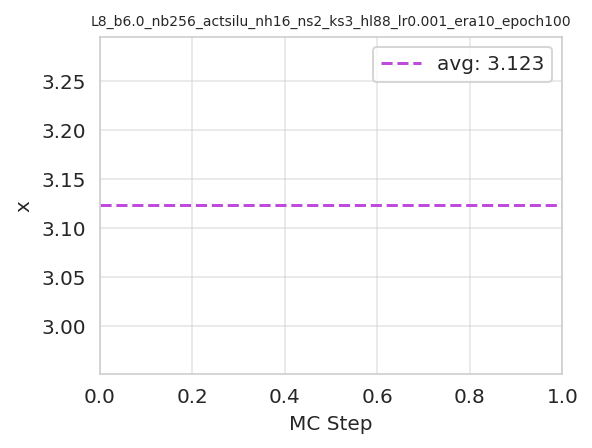

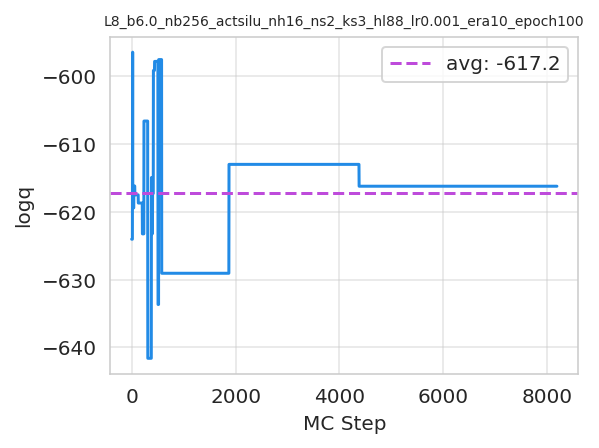

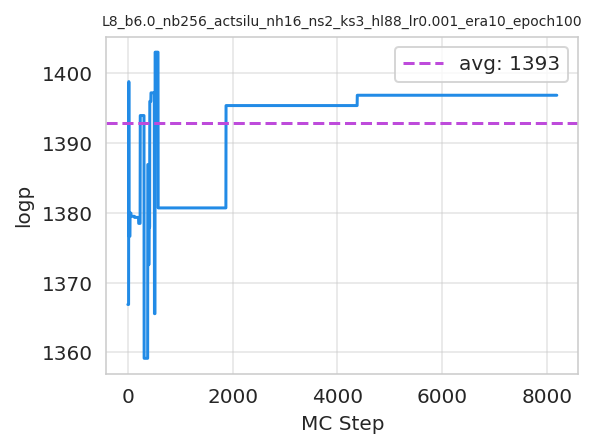

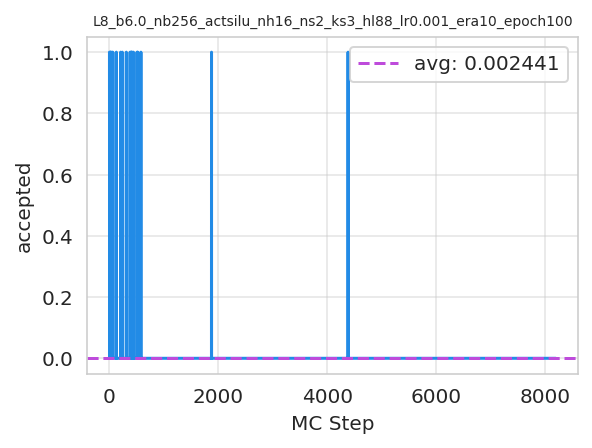

In [38]:
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.inference import U1GaugeAction, make_mcmc_ensemble
from torch.utils.tensorboard import SummaryWriter

NUM_SAMPLES = 8192

logger.rule(f'Running inference on trained model for '
            f'{NUM_SAMPLES} samples')

#param16 = train_outputs16['param']
config16 = train_outputs16['config']
model16 = train_outputs16['model']
outputs16 = train_outputs16['outputs']
#action_fn = qed.BatchAction(train_config.beta)
action_fn16 = U1GaugeAction(config16.beta)
logdir16 = os.path.join(config16.logdir, 'transferred_16x16')
if not os.path.isdir(logdir16):
    os.makedirs(logdir16)
    
#logdir16 = train_config.logdir

inf_dir16 = os.path.join(logdir16, 'inference')
inf_pdir16 = os.path.join(inf_dir16, 'plots')
inf_sdir16 = os.path.join(inf_dir16, 'summaries')

writer16 = SummaryWriter(log_dir=inf_sdir16)

nb = config16.batch_size
history16 = make_mcmc_ensemble(model16,
                               #action=action_fn,
                               action_fn16,
                               batch_size=nb, 
                               num_samples=NUM_SAMPLES,
                               writer=writer16)
                                 #num_samples=NUM_SAMPLES,
                                 #writer=writer)
plot_history(history=history16,
             hline=True,
             config=config16, #skip=['epoch', 'x'],
             num_chains=4, therm_frac=0., xlabel='MC Step',
             outdir=inf_pdir16)

In [ ]:
param16 = train_outputs16['param']
config16 = train_outputs16['config']
model16 = train_outputs16['model']
outputs16 = train_outputs16['outputs']

In [ ]:
action_fn16 = qed.BatchAction(param16.beta)

history16 = make_mcmc_ensemble(model=model16,
                               action_fn=action_fn16,
                               batch_size=config16.batch_size,
                               num_samples=8192)
plot_history(history=history16,
             param=param16, config=config16, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step')#, outdir=inf_pdir8)

## Run `ftHMC` on trained model

In [ ]:
from dataclasses import asdict
from fthmc.utils.plot_helpers import update_plot
from fthmc.field_transformation import FieldTransformation
from fthmc.config import ftConfig

ftconfig16 = ftConfig(tau=1., nstep=15) 

flow16 = train_outputs16['model'].layers
    
if torch.cuda.is_available():
    flow16.to('cuda')
    
flow16.eval()
#pdict = asdict(param)
#pdict['tau'] = 0.1
#pdict['nstep'] = 5


field_transformation16 = FieldTransformation(flow=flow16, config=config16, ftconfig=ftconfig16)

In [27]:
#x_ = hmc_fields[-1][-1].cuda()
#x_ = field_transformation16.wrap(torch.zeros((1, 2, 16, 16)).uniform_(-np.pi, np.pi))

logdir16 = config16.logdir

ftstr16 = ftconfig16.uniquestr()
fthmcdir16 = os.path.join(logdir16, 'ftHMC', ftstr16)

pdir16 = os.path.join(fthmcdir16, 'plots')
sdir16 = os.path.join(fthmcdir16, 'summaries')

writer16 = SummaryWriter(log_dir=sdir16)

runs_history16 = field_transformation16.run(nprint=50,
                                            figsize=(9., 2.),
                                            num_trajs=1024,
                                            writer=writer16,
                                            plotdir=pdir16,
                                            dpi=120, nplot=5, window=1)

RuntimeError: The size of tensor a (16) must match the size of tensor b (8) at non-singleton dimension 2

In [ ]:
from dataclasses import asdict
from fthmc.utils.plot_helpers import update_plot
from fthmc.field_transformation import FieldTransformation

flow16 = model16.layers
    
if torch.cuda.is_available():
    flow16.to('cuda')
    
flow16.eval()

field_transformation16 = FieldTransformation(flow=flow16, param=param16)
x16_ = param16.initializer().cuda()
#x_ = hmc_fields[-1][-1].cuda()

runs_history = field_transformation16.run(x=x16_, nprint=50,
                                          figsize=(9., 2.),
                                          num_runs=2, num_trajs=1000,
                                          dpi=120, nplot=5, window=1)

In [ ]:
# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')
action_fn8 = qed.BatchAction(param8.beta)
dirs8 = train_outputs8['dirs']
logdir8 = dirs8['logdir']

inf_dir8 = os.path.join(logdir8, 'inference')
inf_pdir8 = os.path.join(inf_dir8, 'plots')
history8 = make_mcmc_ensemble(model=train_outputs8['model'],
                               action_fn=action_fn8,
                               batch_size=train_config8.batch_size,
                               num_samples=1000)
plot_history(history=history8,
             param=param8, config=train_config8, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir8)

In [ ]:
%debug